In [1]:
import numpy as np

# Importing standard Qiskit libraries
from qiskit import QuantumCircuit, transpile, Aer, IBMQ, schedule, execute
from qiskit.tools.jupyter import *
from qiskit.visualization import *
from ibm_quantum_widgets import *
from qiskit.providers.aer import QasmSimulator

# Loading your IBM Quantum account(s)
provider = IBMQ.load_account()

import pandas as pd

import qiskit.pulse as pulse
from qiskit.circuit import Parameter

from qiskit_experiments.library.calibration.rough_frequency import RoughFrequencyCal
from qiskit_experiments.library.calibration.frequency_cal import FrequencyCal
from qiskit_experiments.library.calibration.fine_frequency_cal import FineFrequencyCal

from qiskit_experiments.calibration_management.calibrations import Calibrations

from qiskit.tools.monitor import job_monitor

import matplotlib
import matplotlib.pyplot as plt

from IPython.display import HTML

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
from qiskit_experiments.calibration_management.basis_gate_library import FixedFrequencyTransmon

from qiskit import transpile, schedule as build_schedule
from qiskit.pulse import Schedule, Play, SetFrequency, Drag, Gaussian, ShiftFrequency, GaussianSquare, DriveChannel, ControlChannel
from qiskit.circuit import QuantumRegister, ClassicalRegister

from qiskit.circuit import Instruction

# based on https://stackoverflow.com/questions/49503869/attributeerror-while-trying-to-load-the-pickled-matplotlib-figure
def show_figure(fig):
    dummy = plt.figure()
    new_manager = dummy.canvas.manager
    new_manager.canvas.figure = fig
    fig.set_canvas(new_manager.canvas)
    
# based on https://www.delftstack.com/howto/python/parallel-for-loops-python/
import asyncio
import time

def background(f):
    def wrapped(*args, **kwargs):
        return asyncio.get_event_loop().run_in_executor(None, f, *args, **kwargs)
    return wrapped

d = lambda idx: pulse.DriveChannel(idx)
m = lambda idx: pulse.MeasureChannel(idx)
u = lambda idx: pulse.ControlChannel(idx)
a = lambda idx: pulse.AcquireChannel(idx)

provider = IBMQ.get_provider(hub='ibm-q-community', group='ibmquantumawards', project='open-science-22')
# backend = provider.get_backend('ibmq_casablanca')
backend = provider.get_backend('ibmq_jakarta')
# backend = QasmSimulator.from_backend(backend)
"""
provider = IBMQ.get_provider(hub='ibm-q', group='open', project='main')
backend = provider.get_backend('ibmq_armonk')
"""

# configuration - Hardware configuration information.
config = backend.configuration()
# properties - Physical properties of the device.
properties = backend.properties()
# defaults - Information for pulse properties that change frequently.
defaults = backend.defaults()

import matplotlib
import matplotlib.pyplot as plt

import random
import numpy as np
import matplotlib.pyplot as plt

from qiskit.opflow import Zero, One, I, X, Y, Z

from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister, IBMQ, execute, transpile
from qiskit.providers.aer import QasmSimulator
from qiskit.tools.monitor import job_monitor
from qiskit.circuit import Parameter, Gate

from qiskit.ignis.verification.tomography import state_tomography_circuits, StateTomographyFitter
from qiskit.ignis.verification.tomography import process_tomography_circuits, ProcessTomographyFitter
from qiskit.quantum_info import state_fidelity
from qiskit.visualization import plot_histogram
import matplotlib.pyplot as plt
import time

from qiskit import schedule

from qiskit.transpiler.passes import RZXCalibrationBuilderNoEcho, RZXCalibrationBuilder

import numpy as np
from qiskit.circuit import QuantumCircuit
from qiskit.circuit.library import XGate, YGate, SXGate, RZGate
from qiskit.transpiler import PassManager, InstructionDurations
from qiskit.transpiler.passes import ALAPSchedule, ASAPSchedule, DynamicalDecoupling
from qiskit.visualization import timeline_drawer

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
!pip install qctrl-open-controls
!pip install qctrl-visualizer

  Using cached qctrl_open_controls-9.0.0-py3-none-any.whl (37 kB)
  Using cached qctrl_visualizer-2.12.2-py3-none-any.whl (31 kB)


Rabi Rates = [1.0,1.0,1.0,1.0,1.0] x 6.283185307179586
Azimuthal Angles = [0.0,1.0,0.0,-0.5804306232551663,0.5804306232551663] x pi
Detunings = [0,0,0,0,0] x 0.0
Durations = [0.28,0.2,0.04,0.24000000000000005,0.24000000000000005] x 4.166666666666666


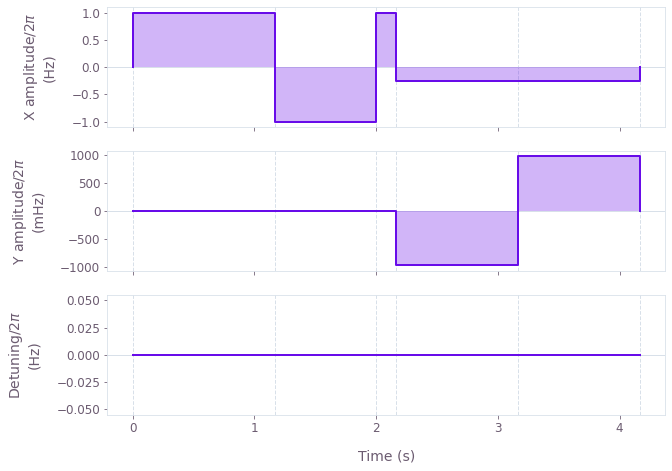

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from qctrlvisualizer import plot_controls
from qctrlopencontrols import (
    DrivenControl,
    new_bb1_control,
    new_primitive_control,
    new_sk1_control,
    new_corpse_control,
    new_scrofulous_control,
    new_gaussian_control,
    new_drag_control,
    new_corpse_in_sk1_control,
    new_corpse_in_bb1_control,
    new_wamf1_control,
    new_corpse_in_scrofulous_control
)

pulse_ = new_wamf1_control(
    rabi_rotation=np.pi,
    azimuthal_angle=0,
    maximum_rabi_rate=2 * np.pi,
)

# pulse_ = new_scrofulous_control(
#     rabi_rotation=np.pi,
#     azimuthal_angle=0,
#     maximum_rabi_rate=2 * np.pi,
# )

# pulse_ = new_sk1_control(
# # pulse_ = new_corpse_control(
# # # pulse_ = new_bb1_control(
#     rabi_rotation=np.pi,
#     azimuthal_angle=0,
#     maximum_rabi_rate=2 * np.pi,
# )

pulse_ = new_corpse_in_sk1_control(
    rabi_rotation=np.pi,
    azimuthal_angle=0,
    maximum_rabi_rate=2 * np.pi,
)

# pulse = new_gaussian_control(
#     rabi_rotation=np.pi/2,
#     segment_count = 10,
#     duration=10*16,
#     width=60
# )

# mult = 5
# pulse_ = new_drag_control(
#     rabi_rotation=np.pi/2,
#     segment_count = 10*mult,
#     duration=10*16*mult,
#     width=60*mult,
#     beta=1.0
# )

print(pulse_)
formatted_plot_data = pulse_.export(coordinates='cartesian', dimensionless_rabi_rate=False)
# print(formatted_plot_data)
figure = plt.figure()
plot_controls(figure, formatted_plot_data)

# plt.plot(pulse_.amplitude_x)
# plt.plot(pulse_.amplitude_y)
# plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from qctrlvisualizer import plot_controls
from qctrlopencontrols import (
    DrivenControl,
    new_bb1_control,
    new_primitive_control,
    new_sk1_control,
    new_corpse_control,
    new_scrofulous_control,
    new_gaussian_control,
    new_drag_control,
    new_corpse_in_sk1_control,
    new_corpse_in_bb1_control,
    new_wamf1_control,
    new_corpse_in_scrofulous_control
)

pulse_ = new_scrofulous_control(
    rabi_rotation=np.pi,
    azimuthal_angle=0,
    maximum_rabi_rate=2 * np.pi,
)

print(pulse_)
formatted_plot_data = pulse_.export(coordinates='cartesian', dimensionless_rabi_rate=False)
figure = plt.figure()
plot_controls(figure, formatted_plot_data)

In [10]:
def gen_waveform(max_duration=225, max_amplitude=0.2):
    time_max = pulse_.times[-1]

    x = []
    y = []

    for idx, time in enumerate(pulse_.times):
        # print(time)
        time_ = pulse_.times[idx]
        if time_ == time_max:
            break
        time_end = pulse_.times[idx+1]
        time_tick = time_max / max_duration
        # print("---")
        while time_ < time_end:
            time_ = time_ + time_tick
            x.append(time_)
            y.append(pulse_.amplitude_x[idx]*max_amplitude + 1j*pulse_.amplitude_y[idx]*max_amplitude)
        # for step in range(timeS, timeE, int((timeE-timeS)/timeMax * max_duration)):
        #     print(step)

    return y

y = gen_waveform(160, 0.01)
# print(y)
# plt.plot(x, y)
# plt.plot(x, [y_.imag for y_ in y])
# plt.show()

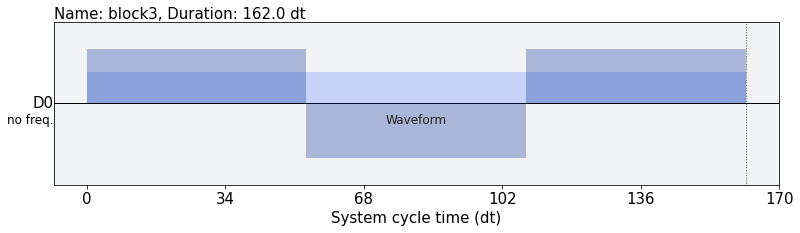

In [13]:
from qiskit import pulse

d0 = pulse.DriveChannel(0)
m0 = pulse.MeasureChannel(0)

y = gen_waveform(160, 0.01)

with pulse.build() as sched:
    pulse.play(y, d0)
    pulse.barrier(d0, m0)

sched.draw()

In [5]:
for x in range(160, 5000):
    rabi_pulse = gen_waveform(x, 0.1)
    if len(rabi_pulse) % 16 == 0:
        print(x, len(rabi_pulse))
        break

174 176


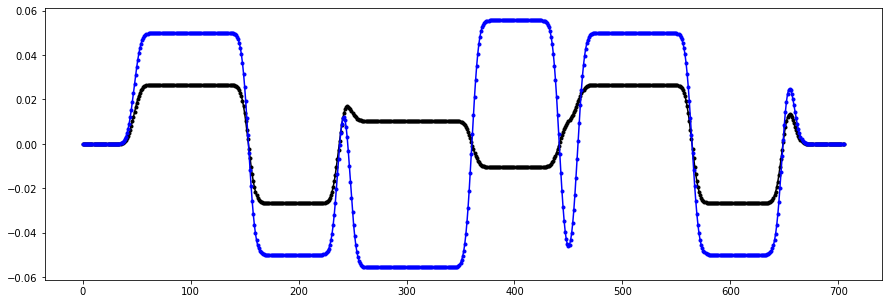

In [6]:
# based on https://matthew-brett.github.io/teaching/smoothing_intro.html
def gaussian_convolution(waveform):
    gaussian_x = np.arange(-6, 6, 0.2) # x from -6 to 6 in steps of 0.1
    gaussian_y = 1 / np.sqrt(2 * np.pi) * np.exp(-gaussian_x ** 2 / 2.)

    def sigma2fwhm(sigma):
        return sigma * np.sqrt(8 * np.log(2))

    def fwhm2sigma(fwhm):
        return fwhm / np.sqrt(8 * np.log(2))

    sigma = 5
    # plt.figure(figsize=(15, 5))

    y_vals = [0]*3*16 + waveform + [0]*3*16
    x_vals = [idx for idx,_ in enumerate(y_vals)]
    smoothed_vals = np.zeros(len(y_vals), dtype=complex)
    for part in ['real', 'imag']:
        if part == 'real':
            y_vals_ = np.array([y.real for y in y_vals])
        else:
            y_vals_ = np.array([y.imag for y in y_vals])        
        x_vals = np.array(x_vals)

        for x_position in x_vals:
            kernel = np.exp(-(x_vals - x_position) ** 2 / (2 * sigma ** 2))
            kernel = kernel / sum(kernel)
            if part == 'real':
                smoothed_vals[x_position] += sum(y_vals_ * kernel)
            elif part == 'imag':
                smoothed_vals[x_position] += 1j*sum(y_vals_ * kernel)
        # plt.plot(x_vals, smoothed_vals, marker='.', color="black" if part=="real" else "blue")
        # plt.plot(x_vals, y_vals_, color="gray" if part=="real" else "lightblue")
    # plt.show()
    
    return smoothed_vals
    
y = gaussian_convolution(gen_waveform(606, 0.009))
plt.figure(figsize=(15, 5))
plt.plot([y_.real for y_ in y], marker='.', color="black")
plt.plot([y_.imag for y_ in y], marker='.', color="blue")
plt.show()

##### rough tune

In [6]:
d = lambda idx: pulse.DriveChannel(idx)
m = lambda idx: pulse.MeasureChannel(idx)
u = lambda idx: pulse.ControlChannel(idx)
a = lambda idx: pulse.AcquireChannel(idx)

max_amp = 0.1
n_rabi_exps = 33

rabi_exps = []
amps = np.linspace(0.05, max_amp, n_rabi_exps)
# qubits = [0, 1, 2, 3, 4, 5, 6]
qubits = [1, 3, 5]
reps = [1, 2, 4, 5, 6, 8, 9, 10, 12] # SX, X
# reps = [rep+(2*12) for rep in reps]

for rep in reps:
    for amp in amps:
        with pulse.build(backend=backend) as rabi_exp:
            # build Rabi pulse
            # rabi_pulse = gaussian_convolution(gen_waveform(606, amp)) # BB1 pi/4 pi/2
            # rabi_pulse = gen_waveform(334, amp) # scrofulous
            # rabi_pulse = gen_waveform(174, amp) # CORPSE
            # rabi_pulse = gen_waveform(221, amp) # wamf1
            rabi_pulse = gen_waveform(174, amp) # scrofulous
            for qubit in qubits:
                # Set frequency
                # play Rabi pulse
                for _ in range(rep):
                    pulse.play(rabi_pulse, d(qubit))
                # pulse.play(rabi_pulse, d(qubit))
            # Barrier
            pulse.barrier(*qubits)
            # Measure
            pulse.measure(qubits)
        rabi_exps.append(rabi_exp)
    print(rep)
    
rabi_exps[-1].instructions[0][1].duration

1
2
4
5
6
8
9
10
12


176

##### fine tune

In [6]:
d = lambda idx: pulse.DriveChannel(idx)
m = lambda idx: pulse.MeasureChannel(idx)
u = lambda idx: pulse.ControlChannel(idx)
a = lambda idx: pulse.AcquireChannel(idx)

n_rabi_exps = 33

rabi_exps = []
qubits = [1, 3, 5]
reps = [1, 2, 4, 5, 6, 8, 9, 10, 12]

# amp_fit = [0.1, 0.0084, 0.1, 0.005, 0.1, 0.0078, 0.1]
# amp_fit = [0, 0.0145, 0, 0.0085, 0, 0.0135, 0]
# amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
# amp_fit = [0, 0.023, 0, 0.013, 0, 0.0225, 0]
# amp_fit = [0, 0.0205, 0, 0.012, 0, 0.018, 0]
# amp_fit = [0, 0.032, 0, 0.019, 0, 0.03, 0]
# amp_fit = [0, 0.017, 0, 0.01, 0, 0.0158, 0]
# amp_fit = [0, 0.0098, 0, 0.0057, 0, 0.009, 0]
# amp_fit = [0, 0.0315, 0, 0.018, 0, 0.029, 0]
# amp_fit = [0, 0.0132, 0, 0.0076, 0, 0.0123, 0]
amp_fit = [0, 0.0134, 0, 0.0078, 0, 0.01235, 0]

amp_fit_ = [np.linspace(amp_*0.9, amp_*1.1, n_rabi_exps) for amp_ in amp_fit]

for rep in reps:
    for amp_idx in range(n_rabi_exps):
        with pulse.build(backend=backend) as rabi_exp:
            for qubit in qubits:
                rabi_pulse = gen_waveform(221, amp_fit_[qubit][amp_idx])
                for _ in range(rep):
                    pulse.play(rabi_pulse, d(qubit))
            pulse.barrier(*qubits)
            pulse.measure(qubits)
        rabi_exps.append(rabi_exp)
    print(rep)
    
rabi_exps[-1].instructions[0][1].duration

1
2
4
5
6
8
9
10
12


224

In [25]:
def gen_qc(qubit, repetitions):
    q0 = qubit
    
    qc = QuantumCircuit(7,1)
    
    for _ in range(repetitions):
        qc.x(q0)
        
    qc.measure([q0],[0])
        
    qc_transpile = transpile(qc, backend, optimization_level=0)
    return qc_transpile

rabi_exps = []
qubits = [1, 3, 5]
reps = [1, 2, 4, 5, 6, 8, 9, 10, 12]
for rep in reps:
    for qubit in qubits:
        rabi_exps.append(gen_qc(qubit, rep))

##### Run Job

In [7]:
rabi_job = execute(rabi_exps, backend, meas_level=1, shots=4*1024)
print(rabi_job.job_id())
job_monitor(rabi_job)

620cc66589a5f01b25aca6f2
Job Status: job has successfully run


In [8]:
from scipy.optimize import curve_fit

rabi_result = rabi_job.result()

scale_factor = 1e-7
rabi_fit_func = lambda x, A, B, drive_period, phi: (A * np.cos(2 * np.pi * x / drive_period - phi) + B)

def fit_x90_and_plot(result, qubit, amps, ax, offset=0, amp_fit=0):
    rabi_values = []
    for i, _ in enumerate(amps):
        rabi_values.append(result.get_memory(i+offset*n_rabi_exps)[qubit]*scale_factor)

    rabi_values = np.real(rabi_values)

    if qubit in [1,3,5]:
        ax.set_facecolor('xkcd:beige')
        colors_ = ["black", "darkblue", "darkgreen", "dimgray", "blue", "green", "gray", "lightblue", "lightgreen"] + ["lightpink"]*100
        color = colors_[offset]
    else:
        color = 'gray'

    if amp_fit is not None:
        plt.axvline(amp_fit, color='red', linestyle='--')
    plt.xlabel("Drive amp [a.u.]", fontsize=15)
    plt.ylabel("Measured signal [a.u.]", fontsize=15)
    
    ax.plot(amps, rabi_values, color=color, marker='.')


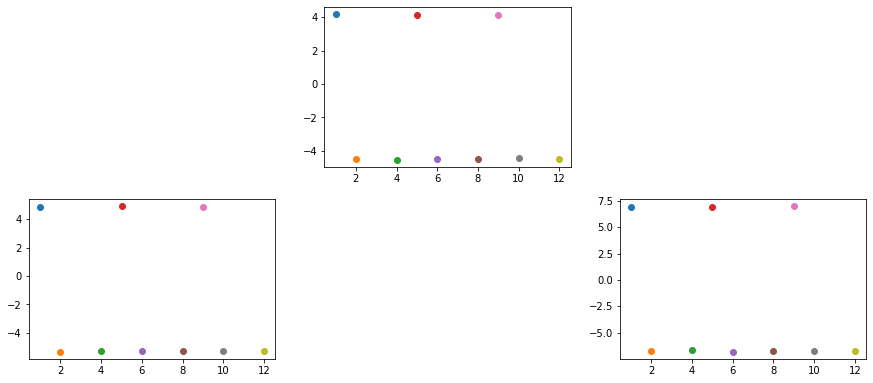

In [66]:
# default - pi - jakarta
plt.figure(figsize=(15, 10))

for qi, qubit_idx in enumerate(qubits):
    for i in range(len(reps)):
        ax = plt.subplot(3, 3, qubit_idx+1)
        ax.scatter(reps[i], rabi_result.get_memory(i*3+qi)*scale_factor)
    # print(reps[i], , i*3)

### CORPSE in SK1

[1, 2, 4, 5, 6, 8, 9, 10, 12]


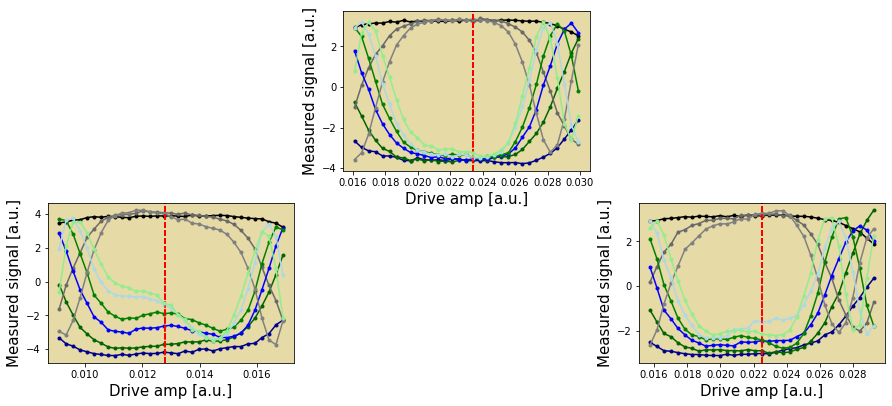

In [41]:
# 816 duration - pi
print(reps)
amp_fit = [0, 0.0234, 0, 0.0128, 0, 0.0225, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


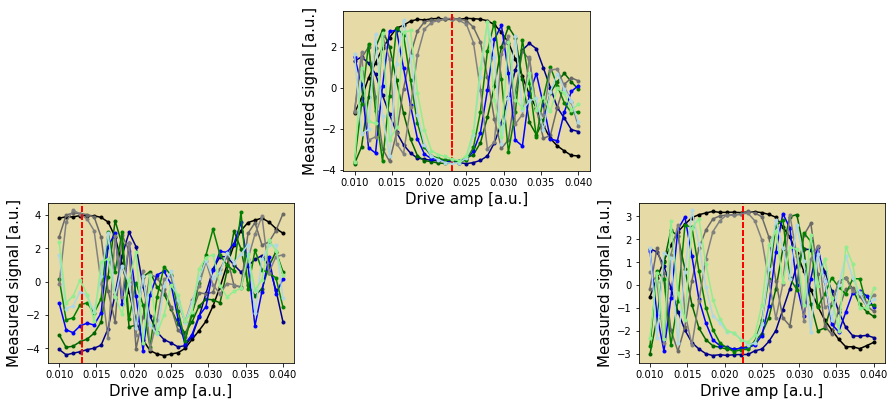

In [37]:
# 816 duration - pi
print(reps)
amp_fit = [0, 0.023, 0, 0.013, 0, 0.0225, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [29]:
amp_fit = [0, 0.0234, 0, 0.0128, 0, 0.0225, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x90:
        rabi_pulse = gen_waveform(829, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x90_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('sx', "+str(qubit)+", x90_q"+str(qubit)+")")


with pulse.build(backend=backend) as x90_q1:
	pulse.play([(0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.14702653618800232+0j), (0.147

[1, 2, 4, 5, 6, 8, 9, 10, 12]


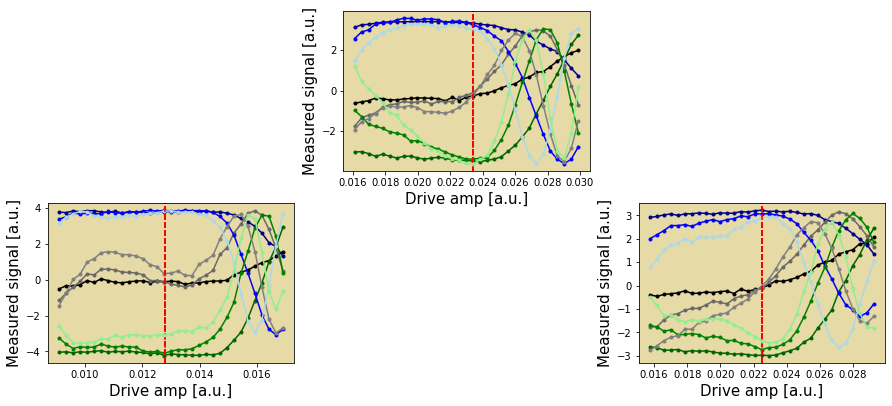

In [28]:
# 832 duration
print(reps)
amp_fit = [0, 0.0234, 0, 0.0128, 0, 0.0225, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


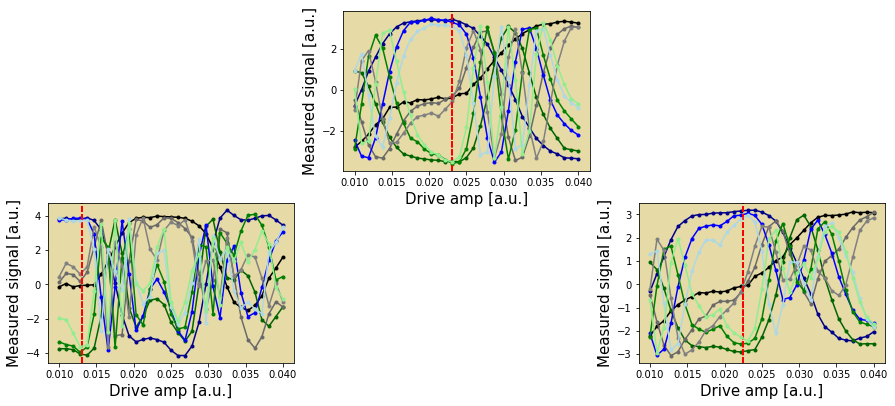

In [21]:
# 832 duration - pi/2
print(reps)
amp_fit = [0, 0.023, 0, 0.013, 0, 0.0225, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


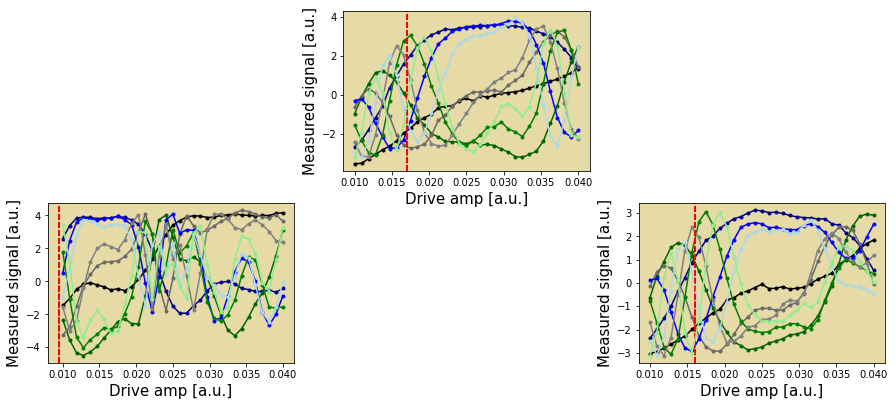

In [13]:
# 605 duration - pi/2
print(reps)
amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


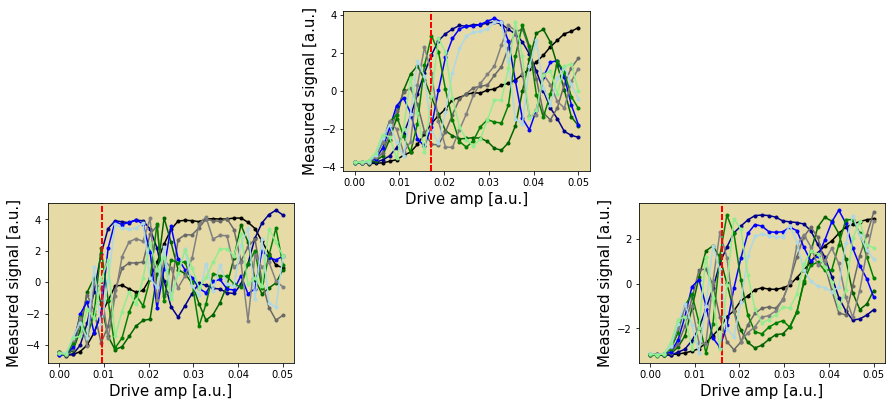

In [9]:
# 605 duration - pi/2
print(reps)
amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

### CORPSE in SCROFULOUS

In [43]:
amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
for qubit in qubits:
    # print(qubit)
    with pulse.build(backend=backend) as x90:
        rabi_pulse = gen_waveform(606, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x90_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('sx', 1, x90_q"+str(qubit)+")")


with pulse.build(backend=backend) as x90_q1:
	pulse.play([(0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.05024795054463361+0.09425712786693297j), (0.050247950544633

[1, 2, 4, 5, 6, 8, 9, 10, 12]


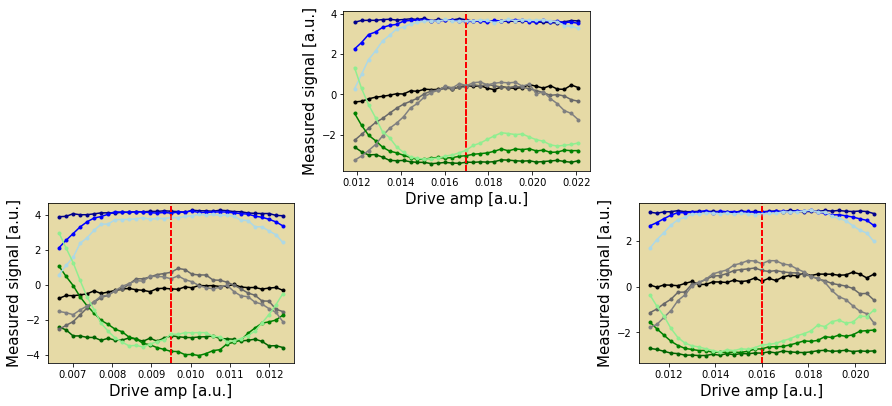

In [42]:
# 608 duration
print(reps)
amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


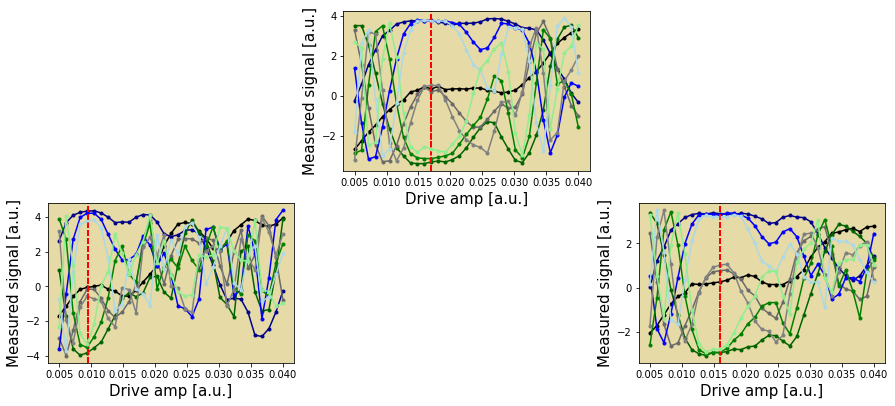

In [34]:
# 1664 duration - pi/2
print(reps)
amp_fit = [0, 0.017, 0, 0.0095, 0, 0.016, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


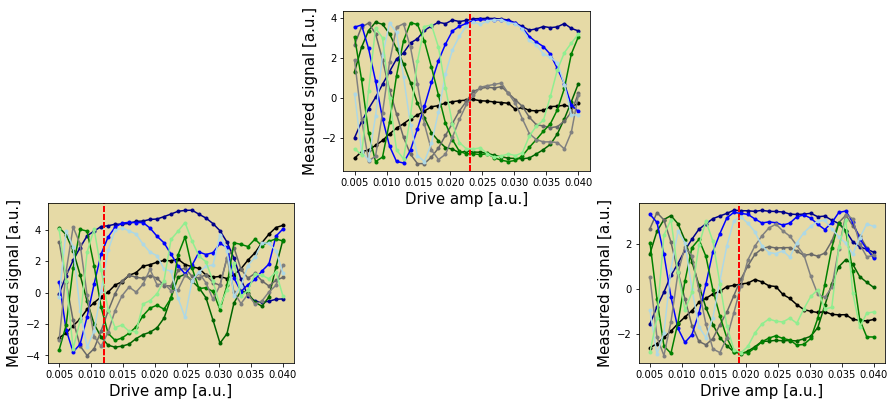

In [24]:
# 1040 duration - pi/2
print(reps)
amp_fit = [0, 0.023, 0, 0.012, 0, 0.019, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


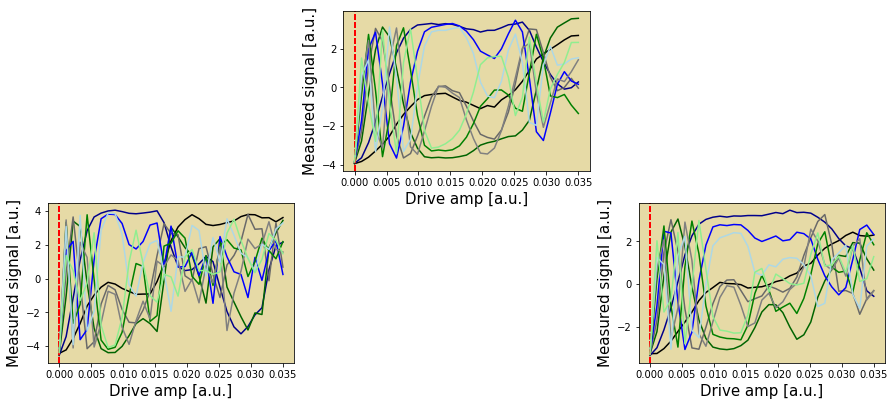

In [41]:
# 2048 duration

print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


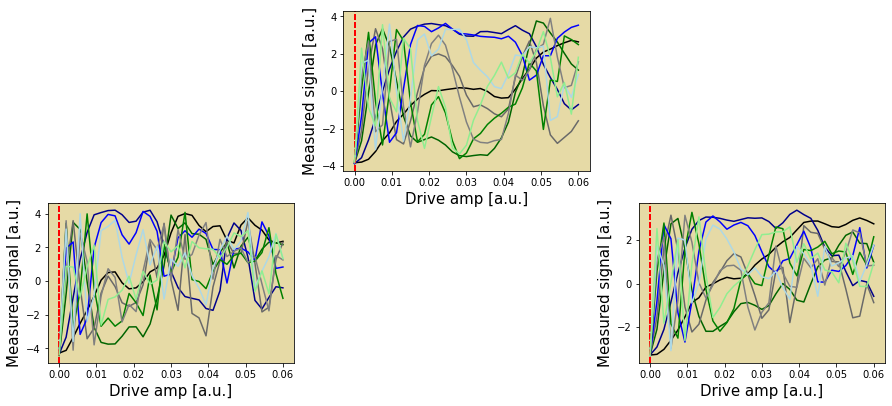

In [36]:
# 1216 duration

print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


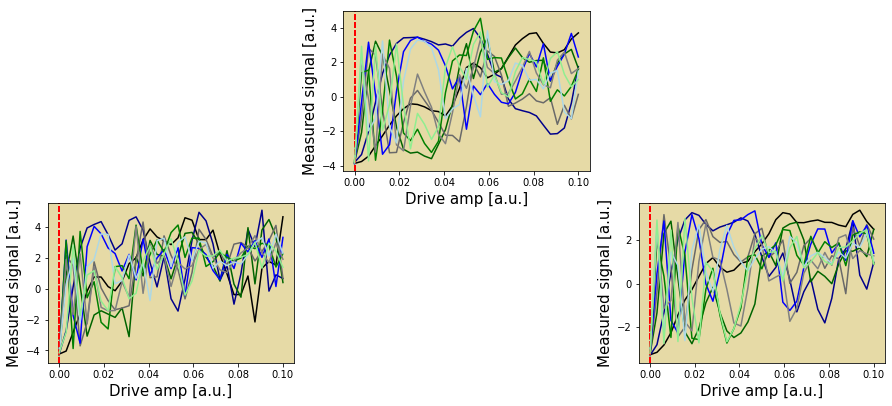

In [31]:
# 912 duration

print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


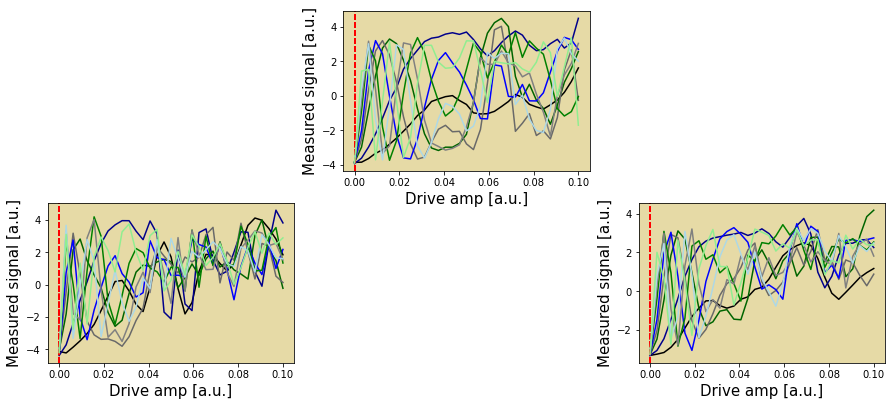

In [26]:
# 624 duration

print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


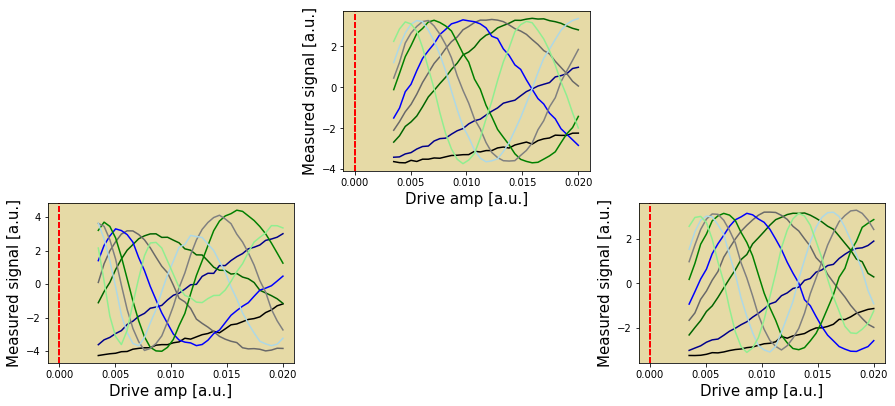

In [22]:
# 624 duration

print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

#### pi/2

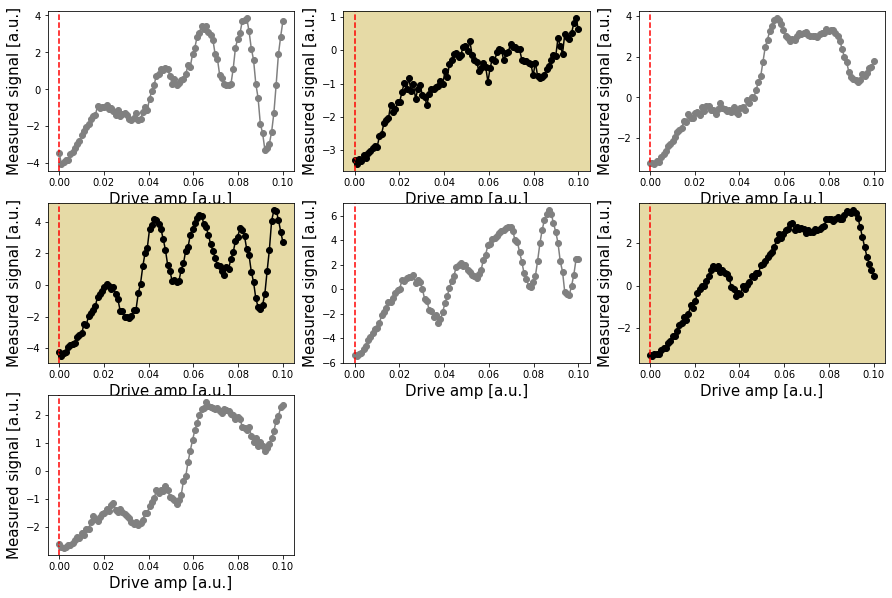

In [206]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

#### pi

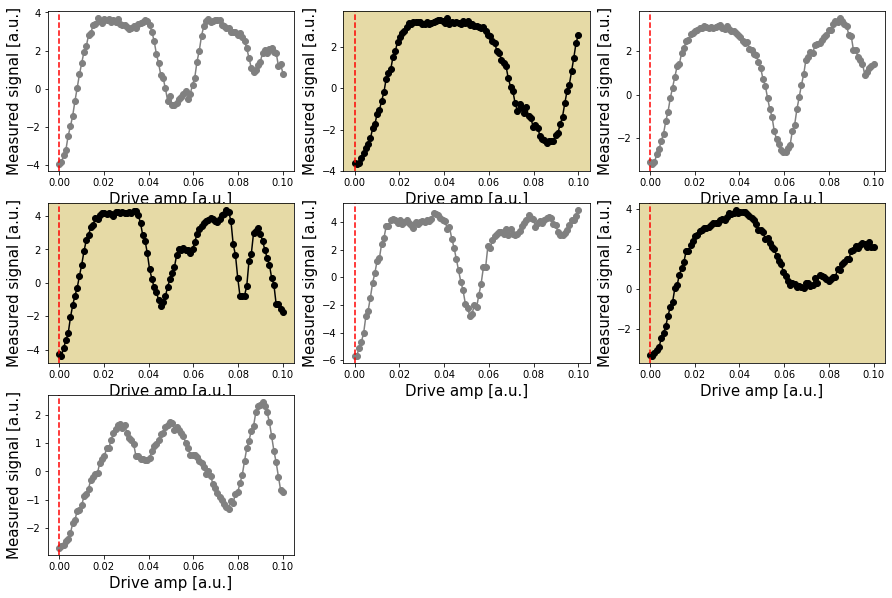

In [180]:
# duration * 2

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

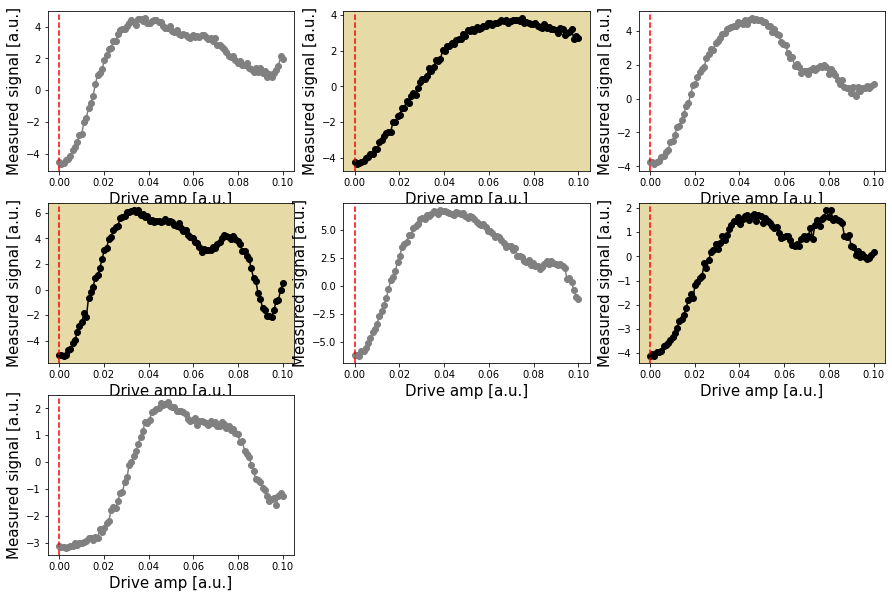

In [175]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### scrofulous

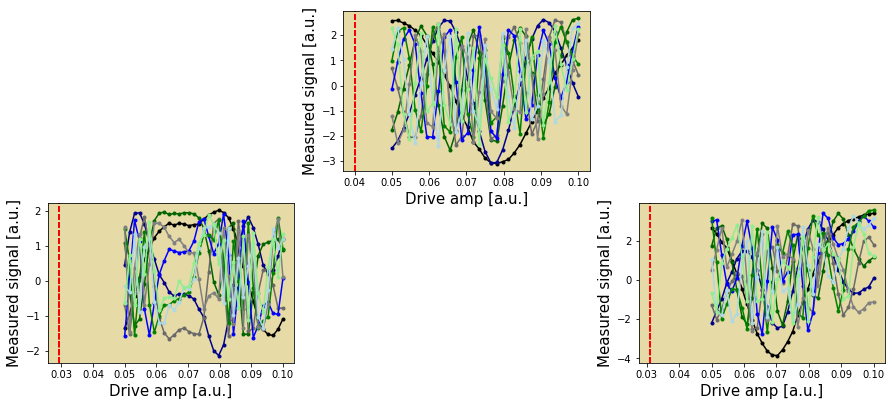

In [9]:
# scrofulouse - pi 176 - jakarta
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

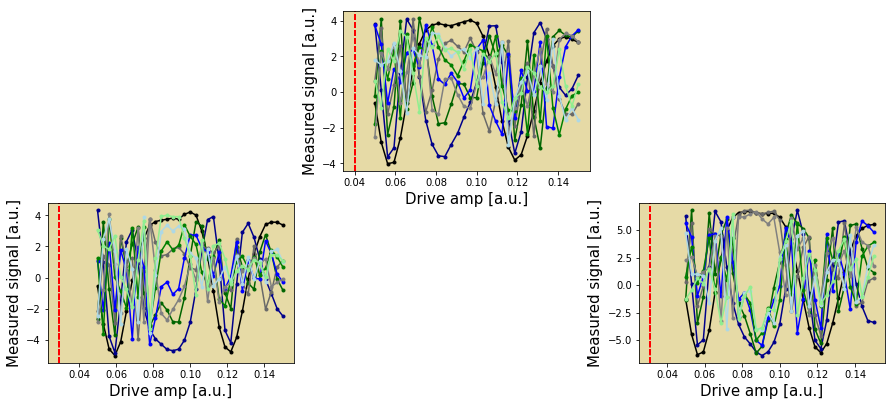

In [70]:
# scrofulouse - pi - jakarta
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

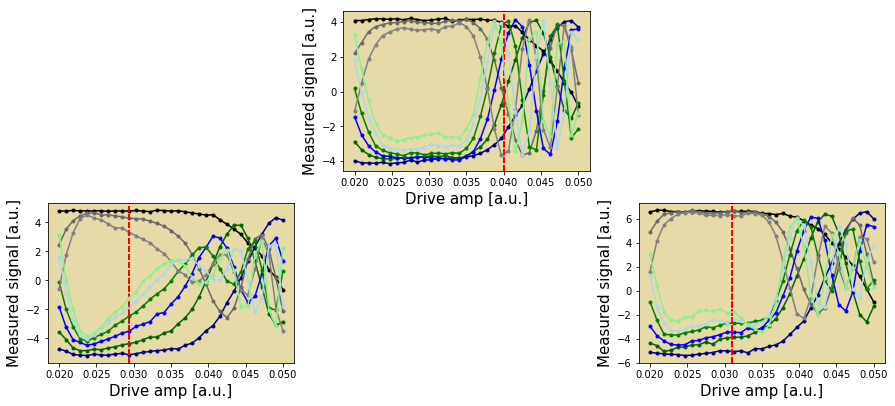

In [22]:
# scrofulouse - pi - jakarta
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

#### Calibration

In [ ]:
# 240 duration - pi - jakarta
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(174, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")

In [45]:
# 176 duration - pi
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(174, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")

with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168+0.21765592370810616j), (0.12566370614359168

[1, 2, 4, 5, 6, 8, 9, 10, 12]


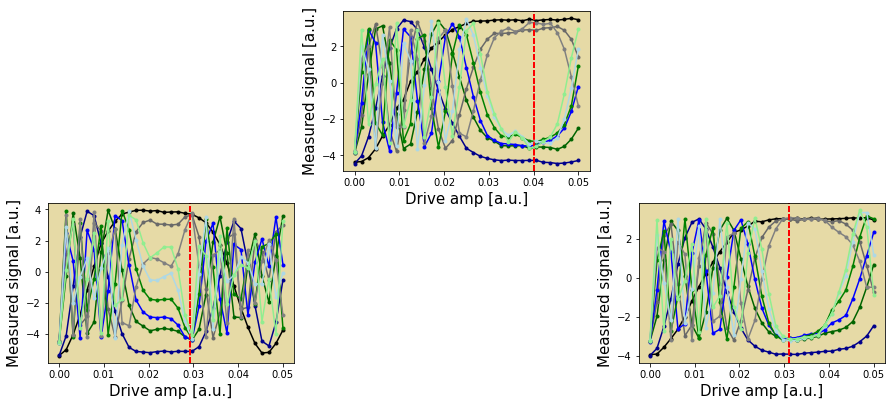

In [43]:
# 176 duration - pi
print(reps)
amp_fit = [0, 0.04, 0, 0.0293, 0, 0.031, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [18]:
# 336 duration - pi
amp_fit = [0, 0.0205, 0, 0.012, 0, 0.018, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(334, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075+0.11154866090040441j), (0.06440264939859075

[1, 2, 4, 5, 6, 8, 9, 10, 12]


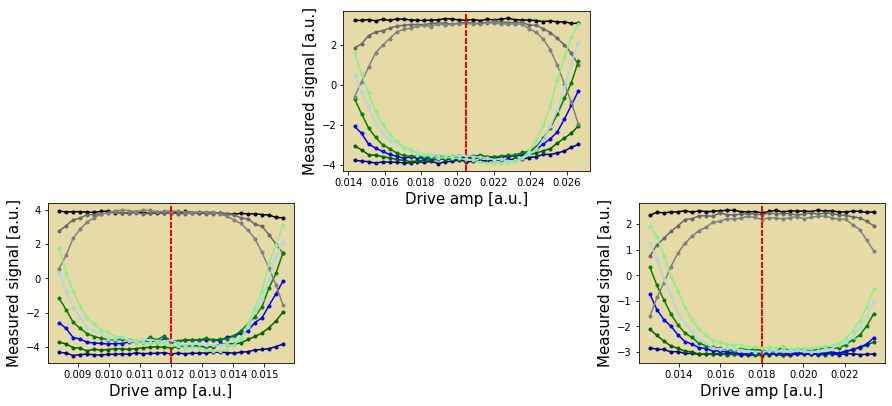

In [17]:
# 336 duration - pi
print(reps)
amp_fit = [0, 0.0205, 0, 0.012, 0, 0.018, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


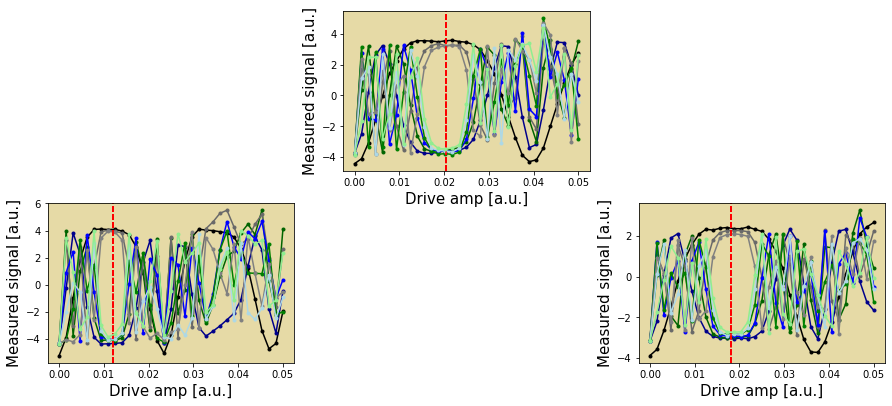

In [13]:
# 336 duration - pi
print(reps)
amp_fit = [0, 0.0205, 0, 0.012, 0, 0.018, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


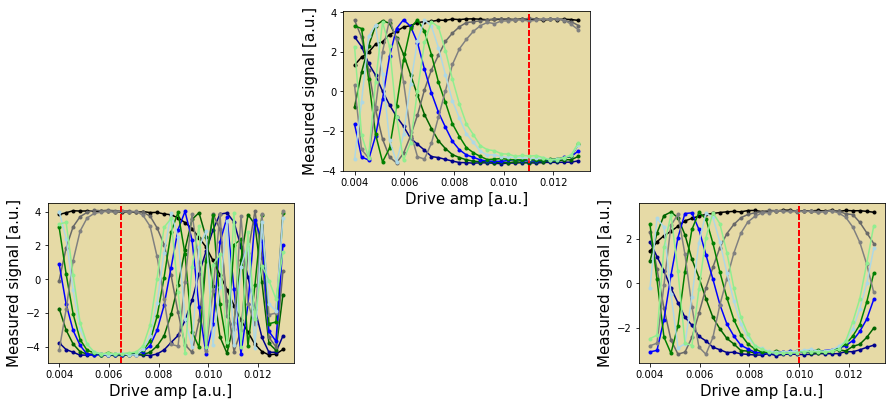

In [237]:
# 624 duration - pi
print(reps)
amp_fit = [0, 0.011, 0, 0.0065, 0, 0.010, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [239]:
for qubit in qubits:
    print(qubit)
    with pulse.build(backend=backend) as x90:
        rabi_pulse = gen_waveform(606, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    # print(x90)

1
3
5


[1, 2, 4, 5, 6, 8, 9, 10, 12]


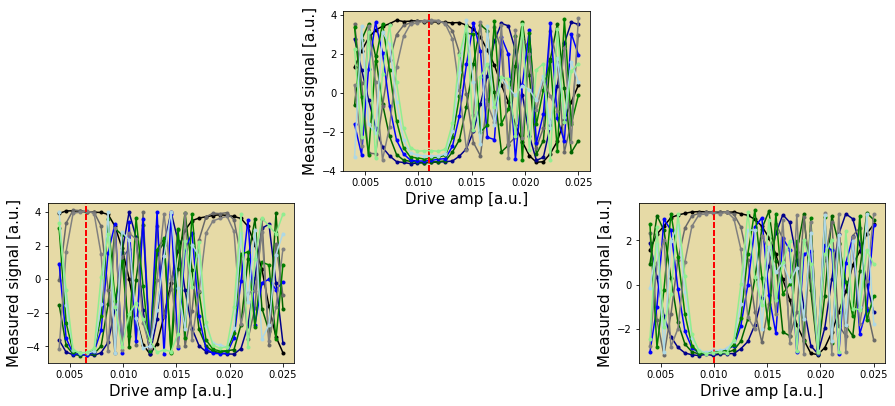

In [233]:
# 624 duration - pi
print(reps)
amp_fit = [0, 0.011, 0, 0.0065, 0, 0.010, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [220]:
for qubit in qubits:
    print(qubit)
    with pulse.build(backend=backend) as x90:
        rabi_pulse = gen_waveform(606, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    # print(x90)


1
3
5


[1, 2, 4, 5, 6, 8, 9, 10, 12]


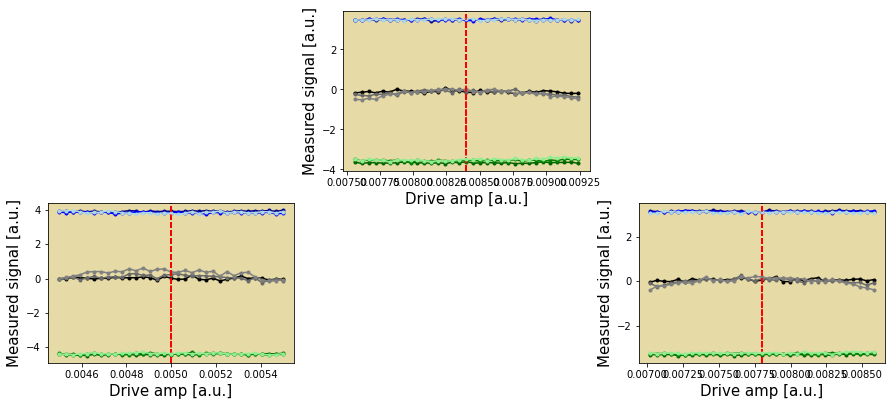

In [209]:
# 608 duration
print(reps)
amp_fit = [0, 0.0084, 0, 0.005, 0, 0.0078, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


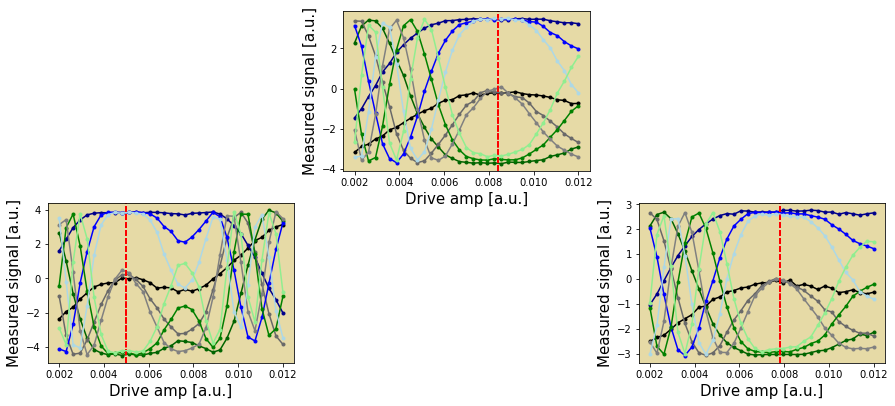

In [9]:
# rerun after few days

# 608 duration
print(reps)
amp_fit = [0, 0.0084, 0, 0.005, 0, 0.0078, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


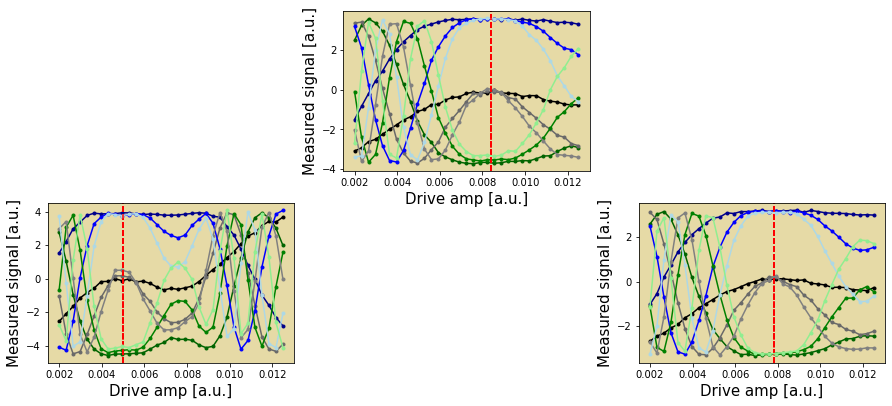

In [203]:
# 608 duration
print(reps)
amp_fit = [0, 0.0084, 0, 0.005, 0, 0.0078, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

#### Gaussian filter

[1, 2, 4, 5, 6, 8, 9, 10, 12]


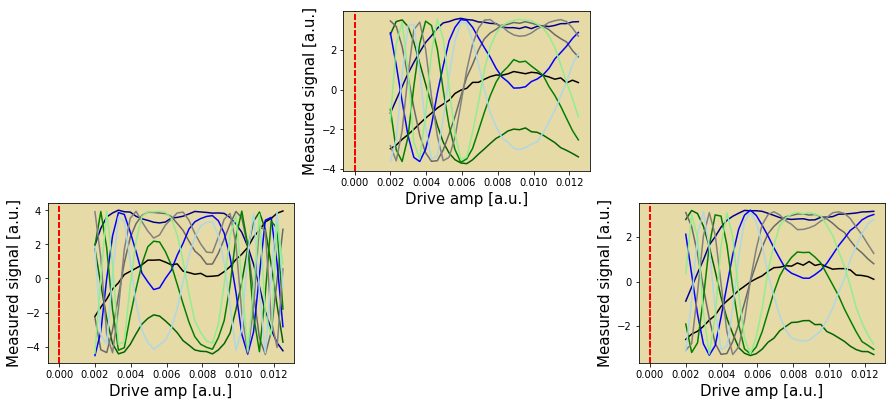

In [180]:
# 704 duration - gaussian sigma=50
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


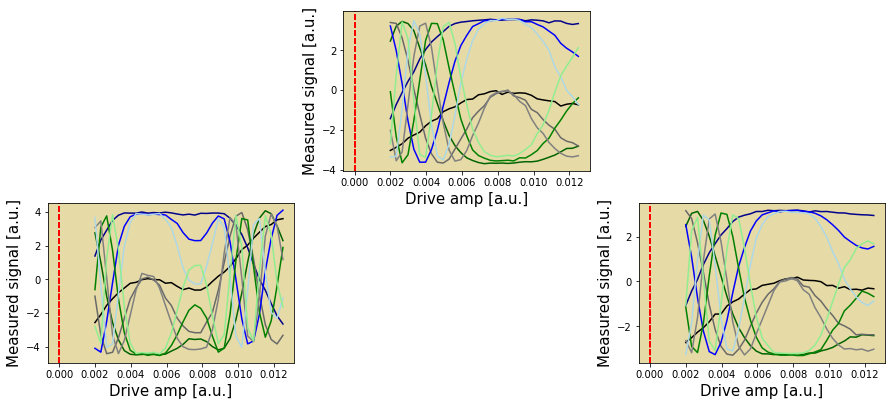

In [172]:
# 704 duration - __NO__ gaussian
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


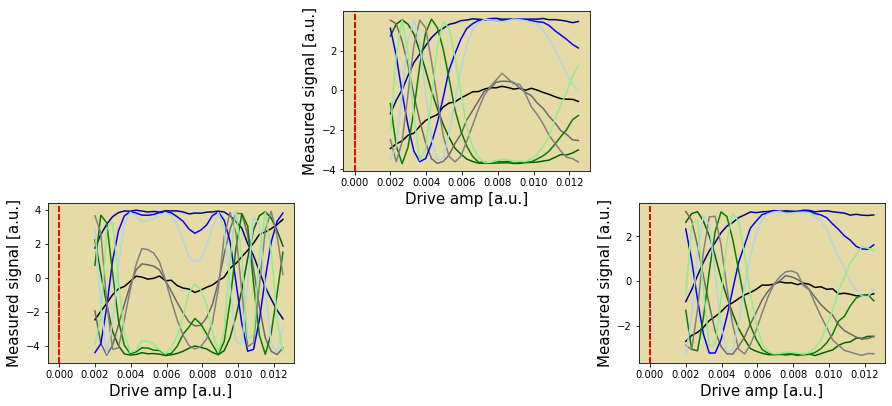

In [168]:
# 704 duration - gaussian sigma=5
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


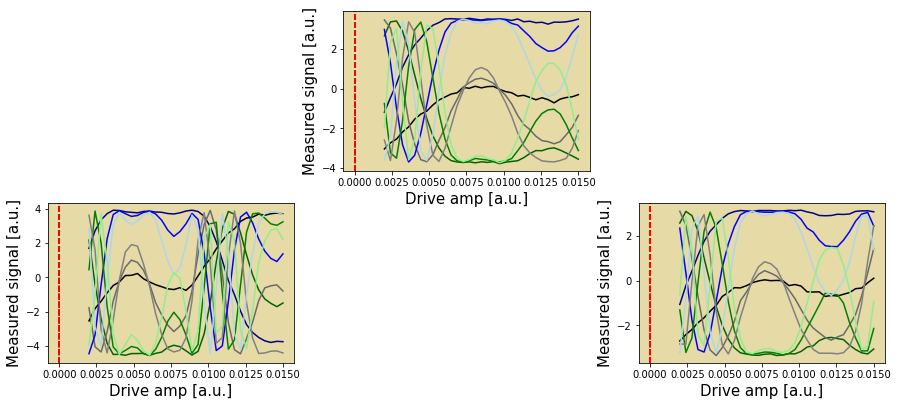

In [162]:
# 704 duration - gaussian sigma=15
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


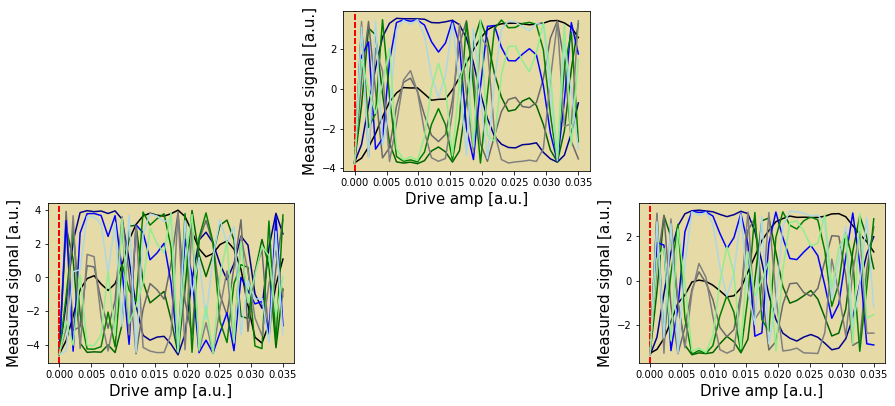

In [155]:
# 704 duration - gaussian sigma=15
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


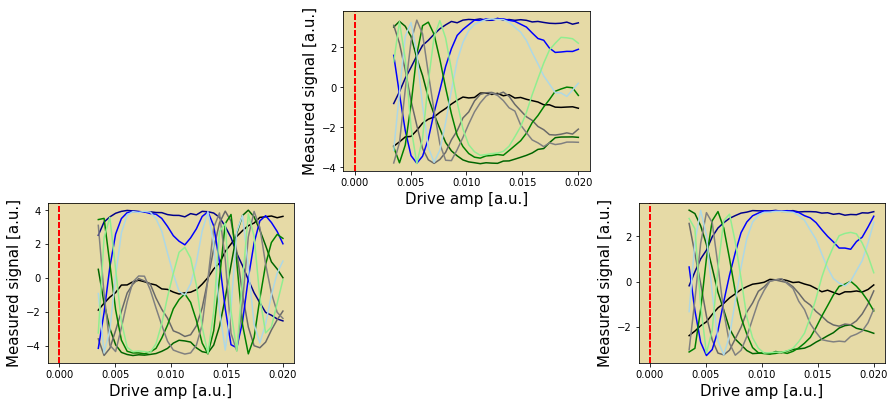

In [14]:
# 416 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

#### No filter

[25, 26, 28, 29, 30, 32, 33, 34, 36]


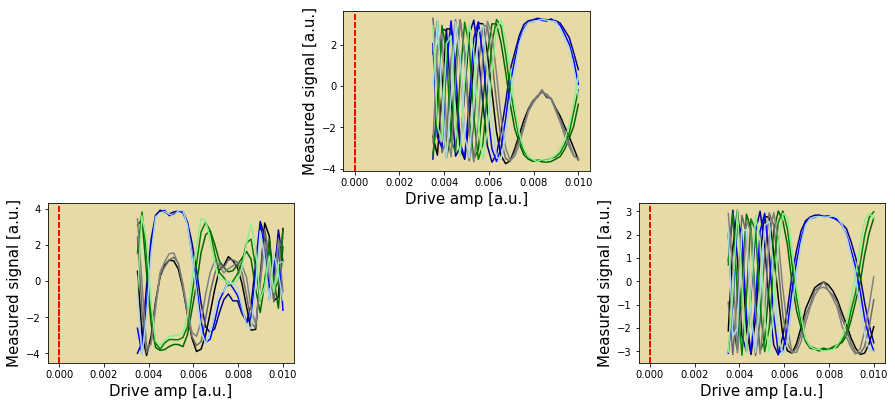

In [9]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[13, 14, 16, 17, 18, 20, 21, 22, 24]


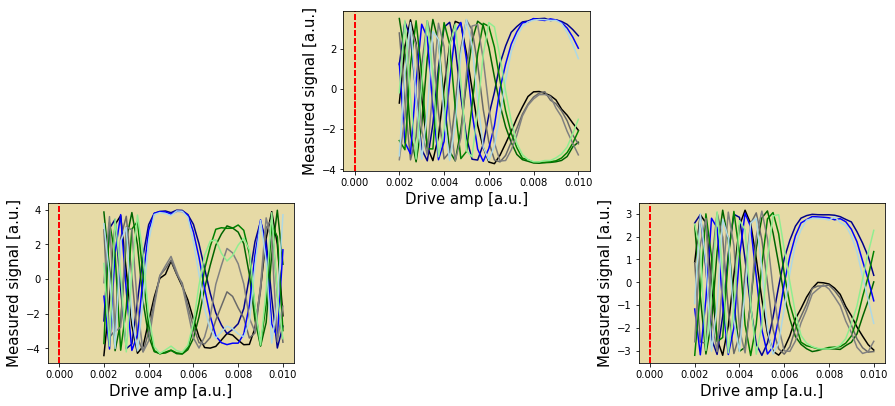

In [400]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


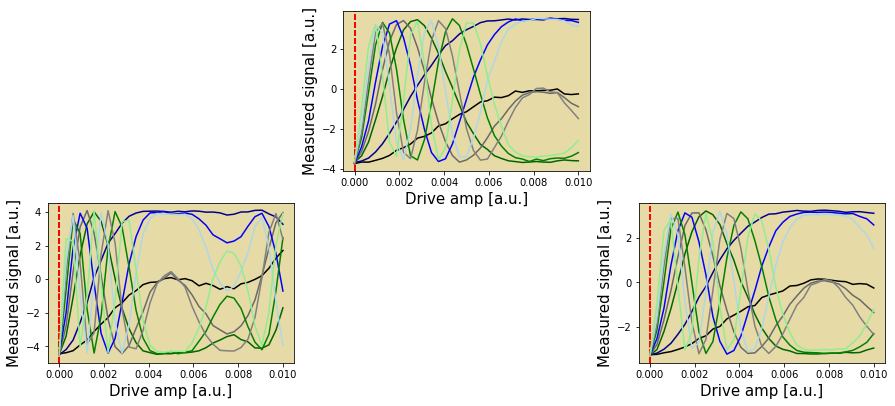

In [396]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


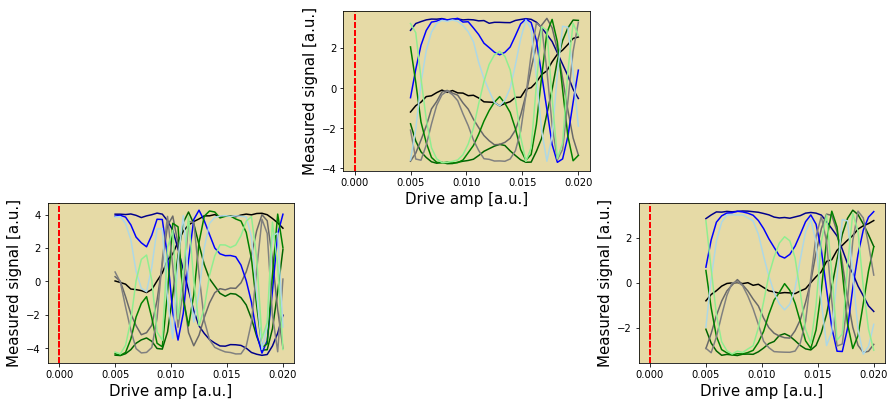

In [392]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


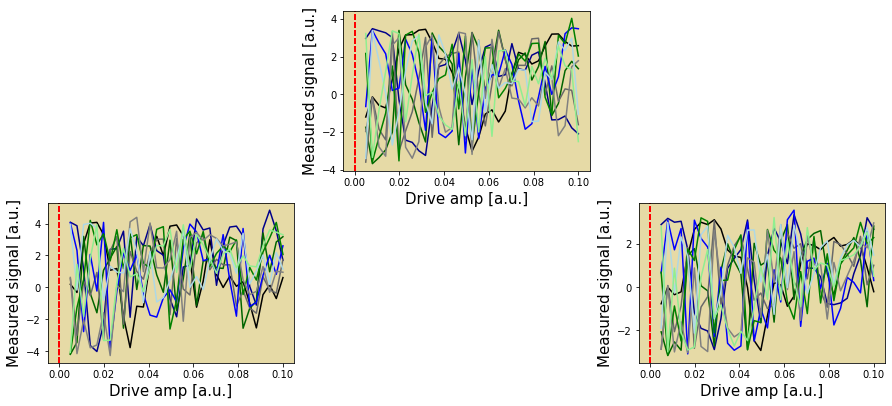

In [388]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

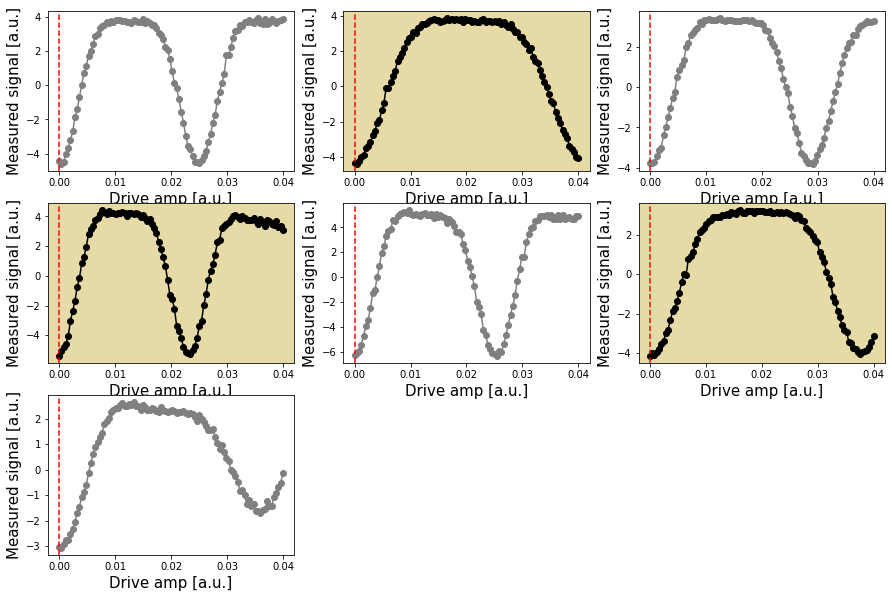

In [154]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### CORPSE in SK1

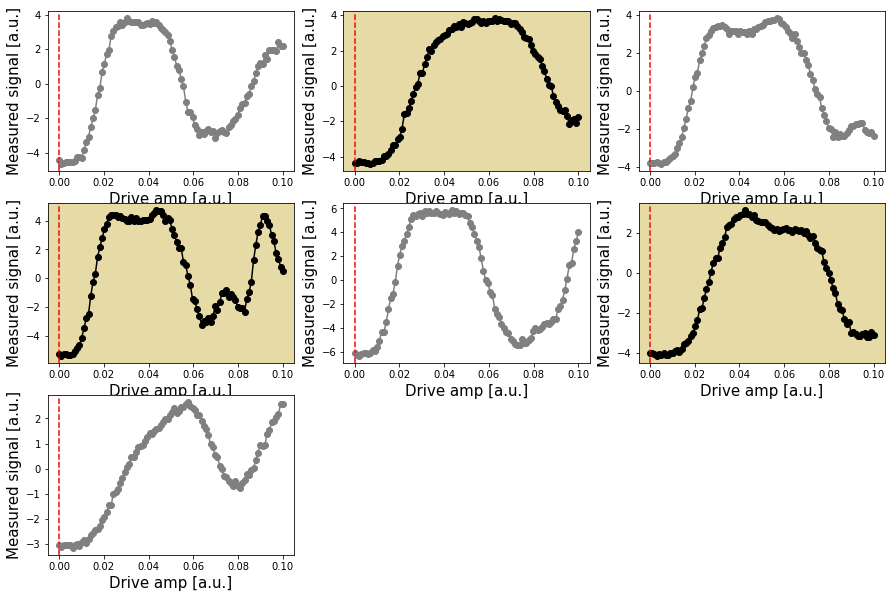

In [137]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### SK1

[1, 2, 4, 5, 6, 8, 9, 10, 12]


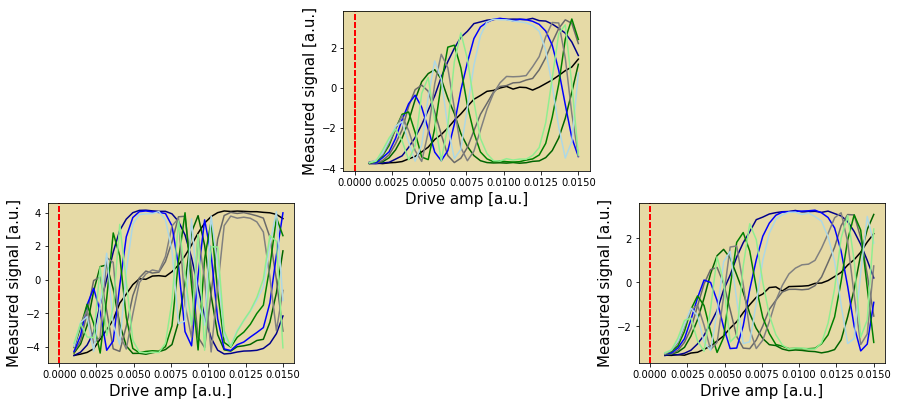

In [379]:
# 912 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


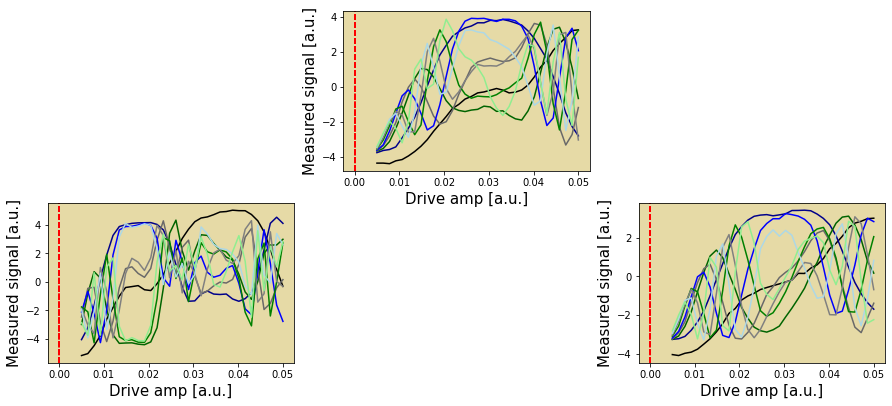

In [374]:
# 304 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[13, 14, 16, 17, 18, 20, 21, 22, 24]


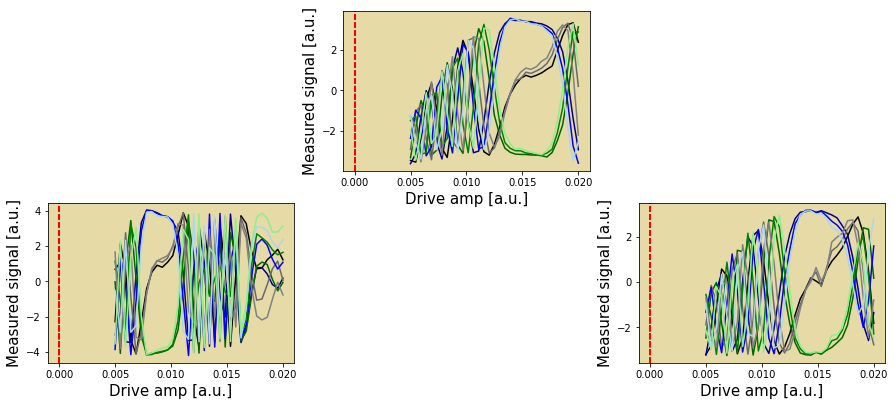

In [368]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


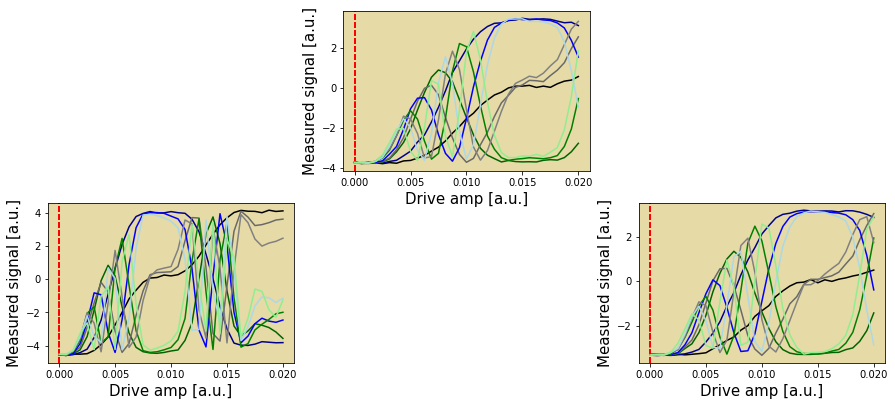

In [364]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


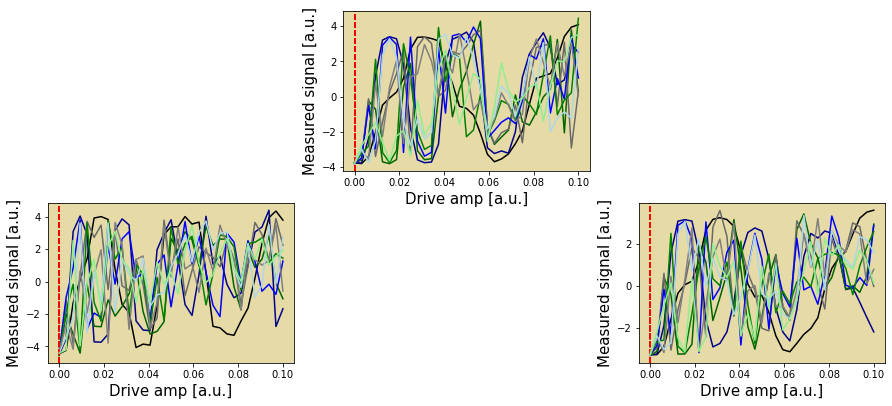

In [360]:
# 608 duration
print(reps)
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
plt.show()

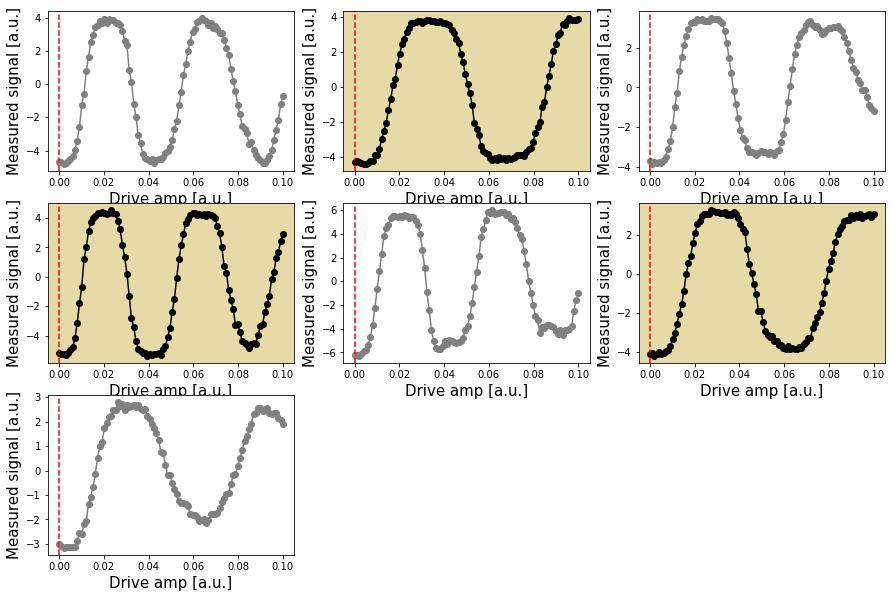

In [130]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### Primitive

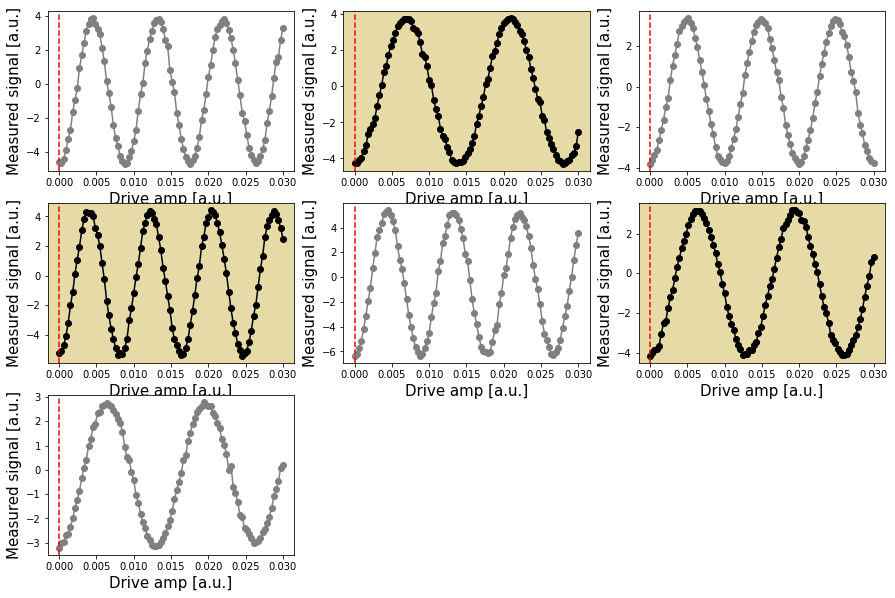

In [116]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### CORPSE

In [32]:
# 304 duration - pi
amp_fit = [0, 0.0323, 0, 0.0186, 0, 0.0298, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(302, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294688542190065+0j), (0.20294

[1, 2, 4, 5, 6, 8, 9, 10, 12]


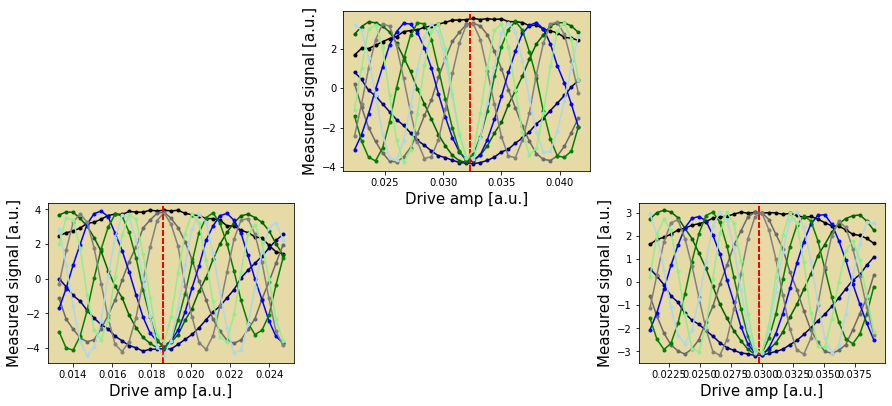

In [28]:
# 304 duration - pi
print(reps)
amp_fit = [0, 0.0323, 0, 0.0186, 0, 0.0298, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


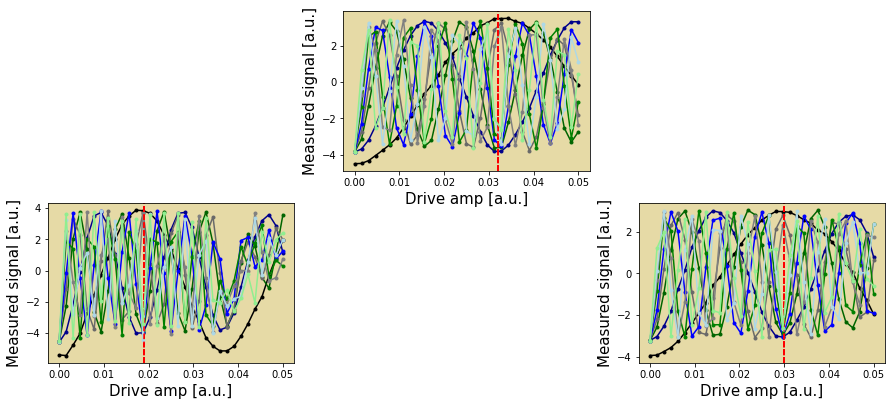

In [16]:
# 304 duration - pi
print(reps)
amp_fit = [0, 0.032, 0, 0.019, 0, 0.03, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [35]:
amp_fit = [0, 0.0146, 0, 0.0086, 0, 0.0135, 0]
for qubit in qubits:
    # print(qubit)
    with pulse.build(backend=backend) as x90:
        rabi_pulse = gen_waveform(606, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x90_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('sx', 1, x90_q"+str(qubit)+")")


with pulse.build(backend=backend) as x90_q1:
	pulse.play([(0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.09173450548482195+0j), (0.091

[1, 2, 4, 5, 6, 8, 9, 10, 12]


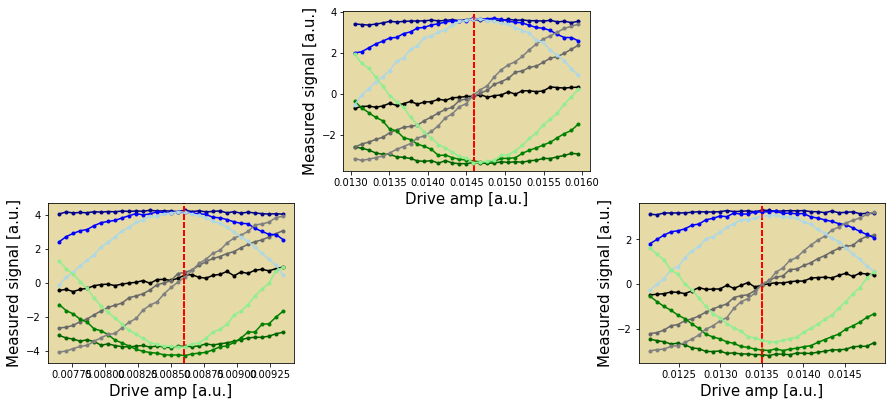

In [33]:
# 608 duration
print(reps)
amp_fit = [0, 0.0146, 0, 0.0086, 0, 0.0135, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


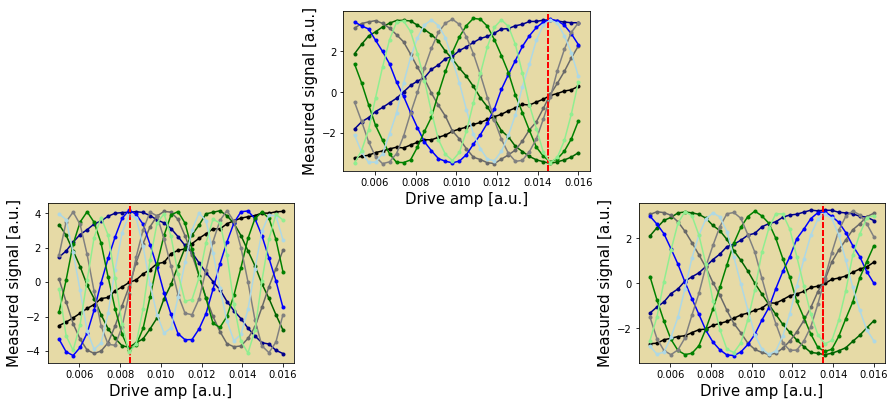

In [26]:
# 608 duration - pi
print(reps)
amp_fit = [0, 0.0145, 0, 0.0085, 0, 0.0135, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


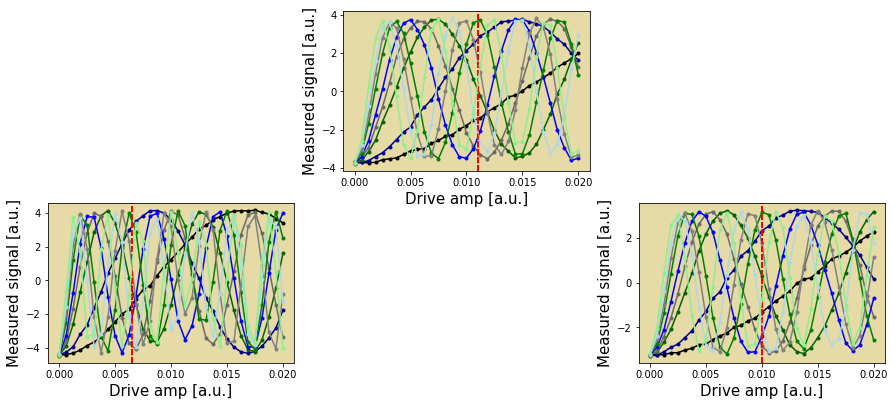

In [20]:
# 608 duration - pi
print(reps)
amp_fit = [0, 0.011, 0, 0.0065, 0, 0.010, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


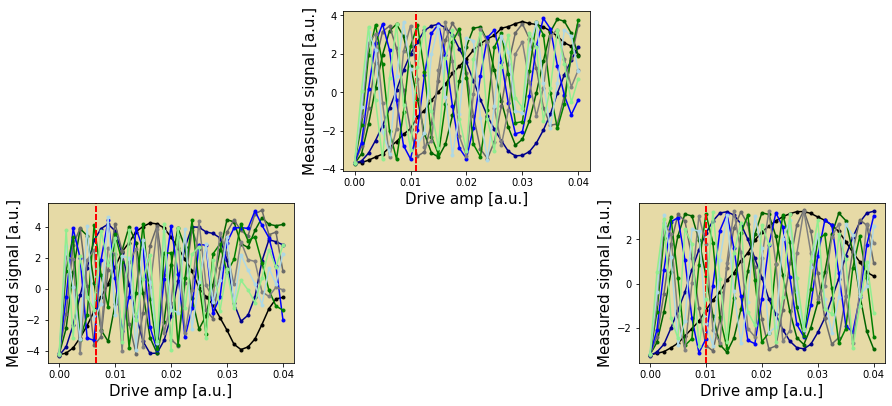

In [16]:
# 608 duration - pi
print(reps)
amp_fit = [0, 0.011, 0, 0.0065, 0, 0.010, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


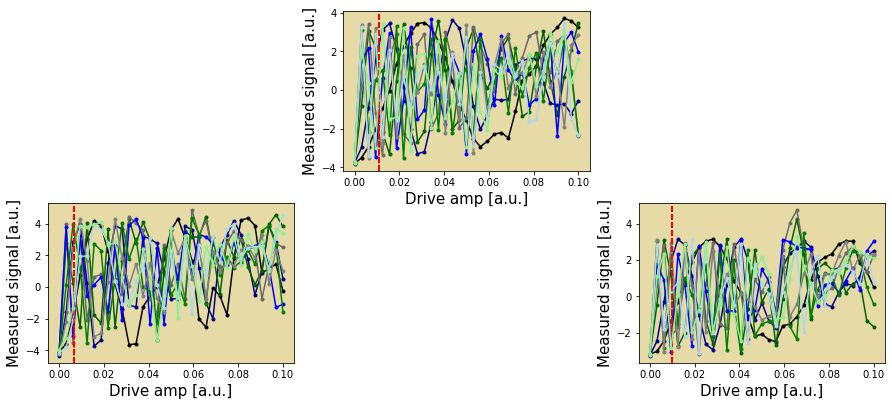

In [11]:
# 608 duration - pi
print(reps)
amp_fit = [0, 0.011, 0, 0.0065, 0, 0.010, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

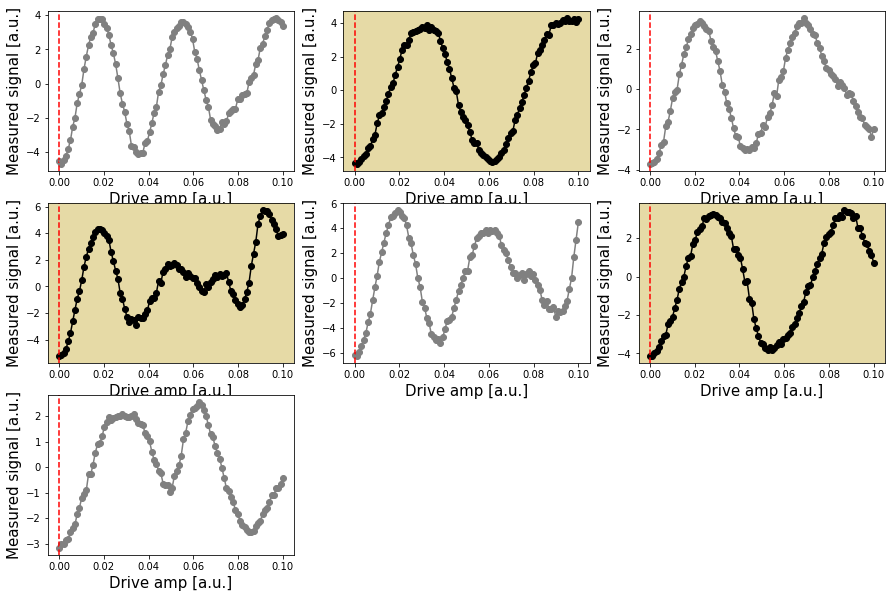

In [124]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    # print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

### WAMF1

In [37]:
# 224 duration - pi/2 14.02.2022
amp_fit = [0, 0.0092, 0, 0.0097, 0, 0.0091, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(221, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as sx_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('sx', "+str(qubit)+", sx_q"+str(qubit)+")")


with pulse.build(backend=backend) as sx_q1:
	pulse.play([(0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j), (0.057805304826052194+0j)

[1, 2, 4, 5, 6, 8, 9, 10, 12]


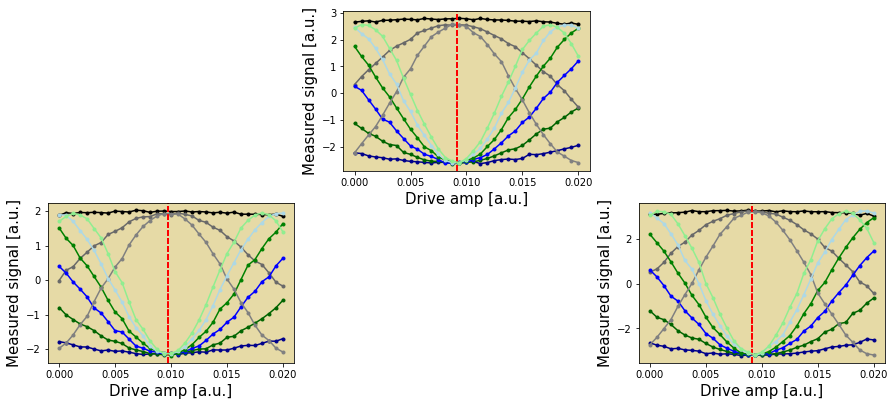

In [34]:
# 224 duration - pi/2 14.02.2022
print(reps)
amp_fit = [0, 0.0092, 0, 0.0097, 0, 0.0091, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [21]:
# 224 duration - pi 14.02.2022
amp_fit = [0, 0.01328, 0, 0.00778, 0, 0.01229, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(221, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344070087934491+0j), (0.08344

[1, 2, 4, 5, 6, 8, 9, 10, 12]


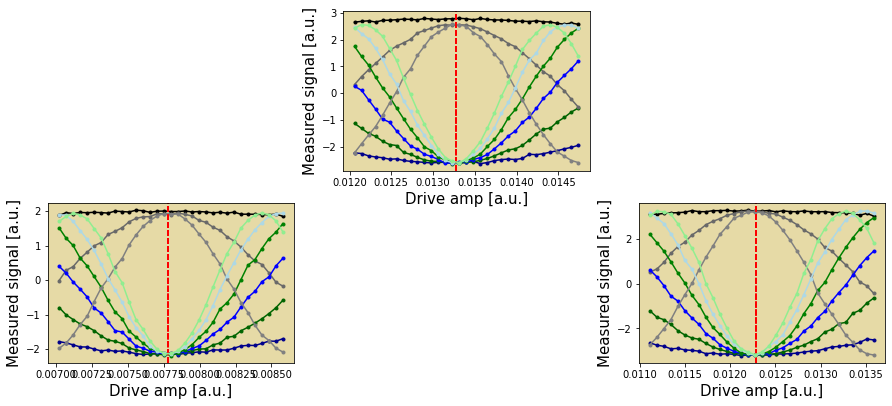

In [20]:
# 224 duration - pi 14.02.2022
print(reps)
amp_fit = [0, 0.01328, 0, 0.00778, 0, 0.01229, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [96]:
# 224 duration - pi
amp_fit = [0, 0.0134, 0, 0.0078, 0, 0.01235, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(221, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419468311620645+0j), (0.08419

[1, 2, 4, 5, 6, 8, 9, 10, 12]


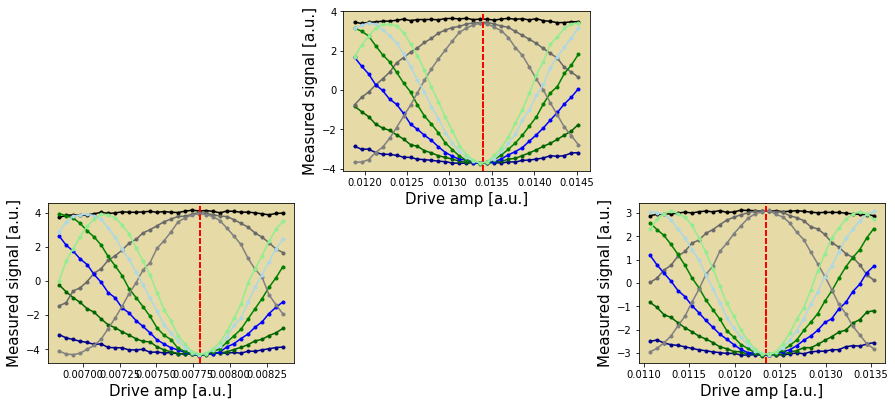

In [95]:
# 224 duration - pi
print(reps)
amp_fit = [0, 0.0134, 0, 0.0078, 0, 0.01235, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


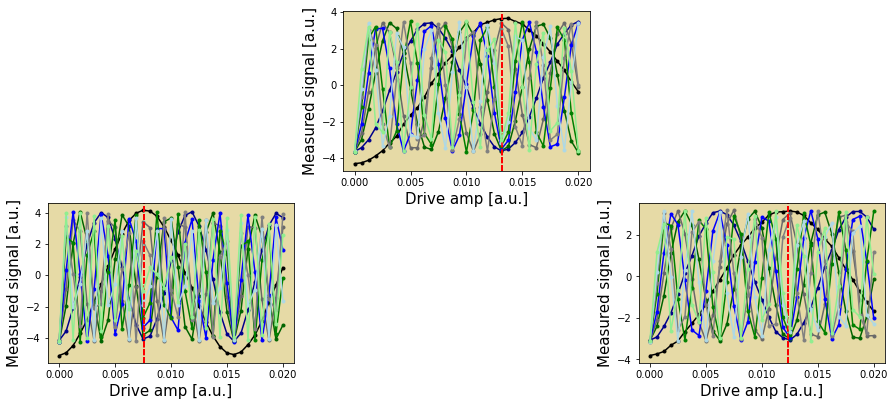

In [87]:
# 224 duration - pi
print(reps)
amp_fit = [0, 0.0132, 0, 0.0076, 0, 0.0123, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [72]:
# 96 duration - pi
amp_fit = [0, 0.0311, 0, 0.0182, 0, 0.0288, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(93, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.19540706305328512+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770353152664256+0j), (0.09770

[1, 2, 4, 5, 6, 8, 9, 10, 12]


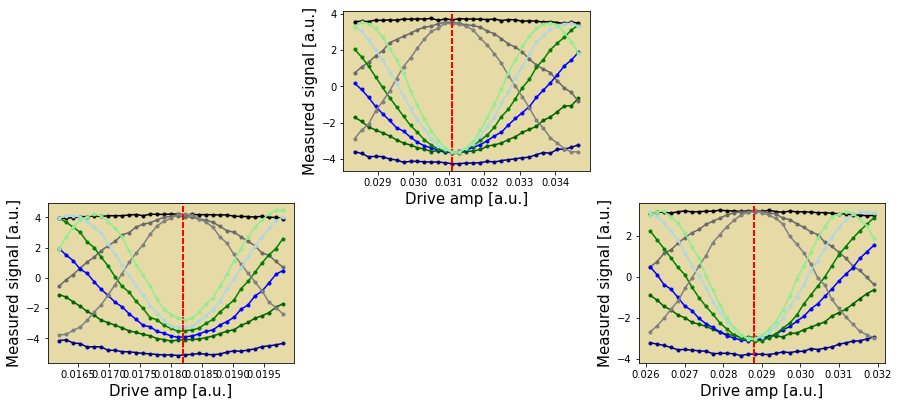

In [71]:
# 96 duration - pi
print(reps)
amp_fit = [0, 0.0311, 0, 0.0182, 0, 0.0288, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


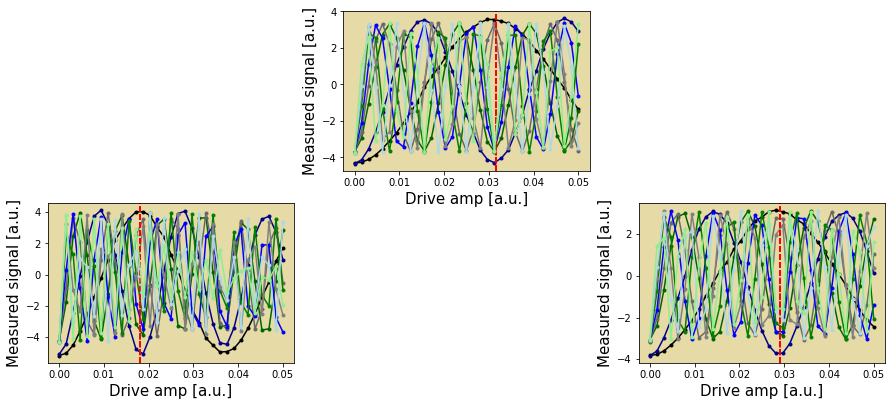

In [61]:
# 96 duration - pi
print(reps)
amp_fit = [0, 0.0315, 0, 0.018, 0, 0.029, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [51]:
# 304 duration - pi
amp_fit = [0, 0.00986, 0, 0.00573, 0, 0.00909, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(301, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195220712879072+0j), (0.06195

[1, 2, 4, 5, 6, 8, 9, 10, 12]


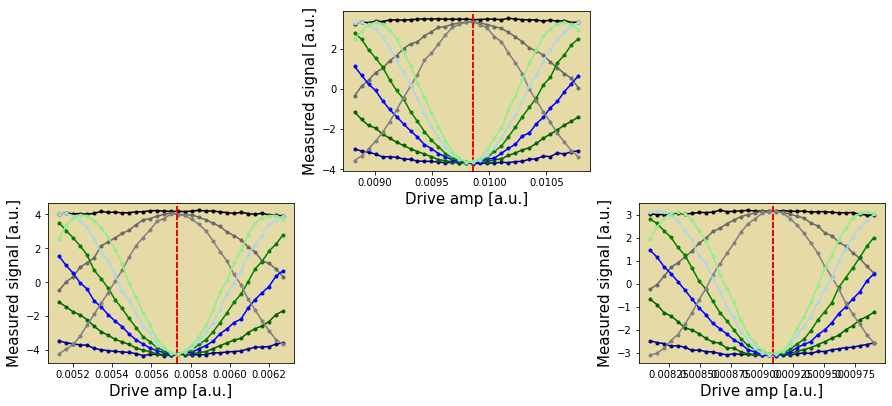

In [50]:
# 304 duration - pi
print(reps)
amp_fit = [0, 0.00986, 0, 0.00573, 0, 0.00909, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


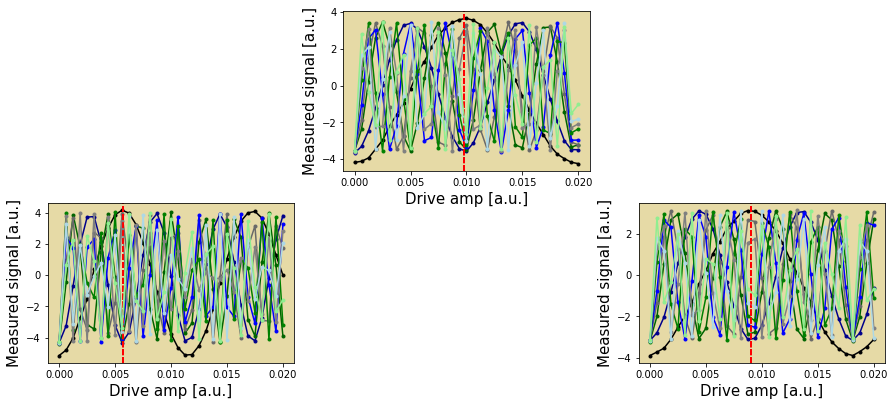

In [36]:
# 304 duration - pi
print(reps)
amp_fit = [0, 0.0098, 0, 0.0057, 0, 0.009, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

In [26]:
# 176 duration - pi
amp_fit = [0, 0.017, 0, 0.01, 0, 0.0158, 0]
for qubit in qubits:
    with pulse.build(backend=backend) as x:
        rabi_pulse = gen_waveform(173, amp_fit[qubit])
        pulse.play(rabi_pulse, d(qubit))
    print("with pulse.build(backend=backend) as x_q"+str(qubit)+":")
    print("\tpulse.play(" + str(rabi_pulse) + ", d("+str(qubit)+"))")
    print("inst_map_cal.add('x', "+str(qubit)+", x_q"+str(qubit)+")")


with pulse.build(backend=backend) as x_q1:
	pulse.play([(0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681415022205297+0j), (0.10681

[1, 2, 4, 5, 6, 8, 9, 10, 12]


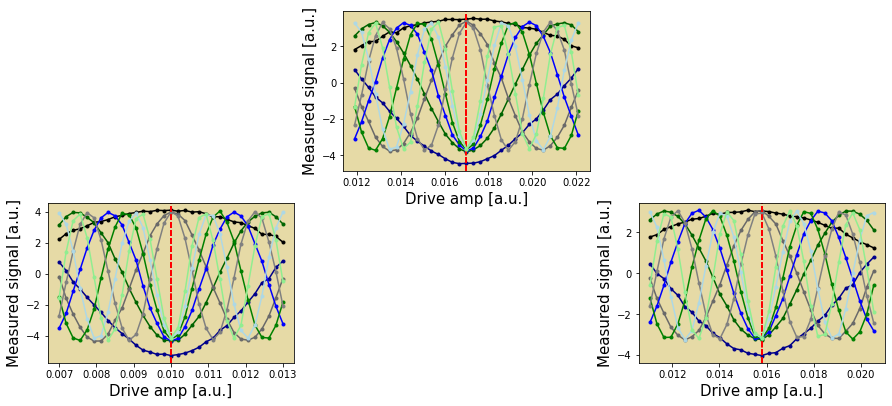

In [25]:
# 176 duration - pi
print(reps)
amp_fit = [0, 0.017, 0, 0.01, 0, 0.0158, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amp_fit_[qubit_idx], ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


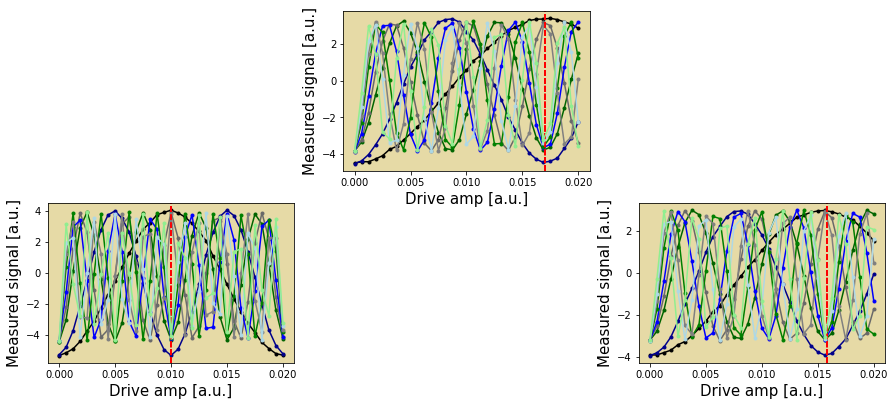

In [21]:
# 176 duration - pi
print(reps)
amp_fit = [0, 0.017, 0, 0.01, 0, 0.0158, 0]
plt.figure(figsize=(15, 10))
for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx, amp_fit=amp_fit[qubit_idx])
plt.show()

### BB1

#### Pi/2 multireps

[13, 14, 16, 17, 18, 20, 21, 22, 24]


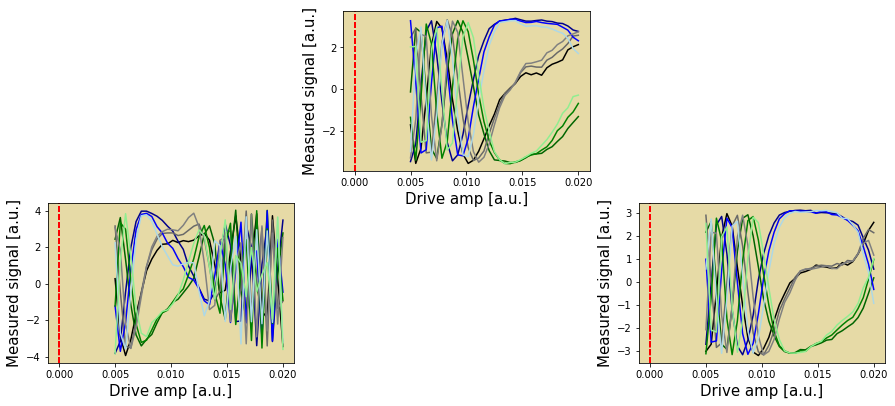

In [353]:
# 608 duration

x90_amps = []
print(reps)

plt.figure(figsize=(15, 10))

for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
        x90_amps.append(x90_amp)
plt.show()

[1, 2, 4, 5, 6, 8, 9, 10, 12]


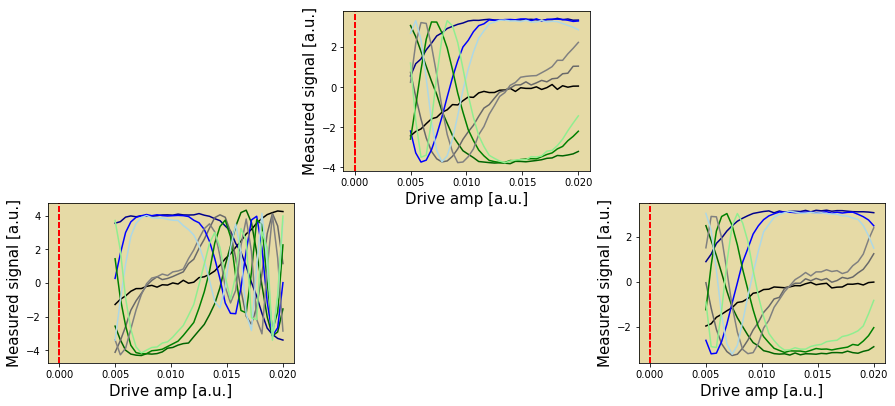

In [349]:
# 608 duration

x90_amps = []
print(reps)

plt.figure(figsize=(15, 10))

for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
        x90_amps.append(x90_amp)
plt.show()

[1, 2, 4, 5, 6, 8]


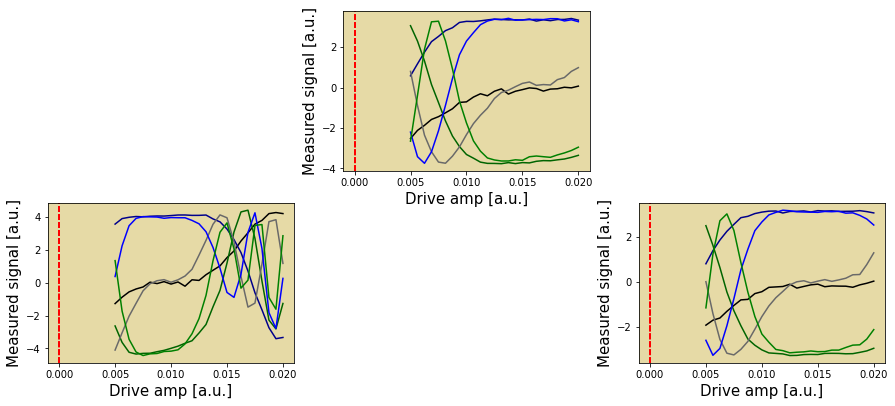

In [344]:
# 608 duration

x90_amps = []
print(reps)

plt.figure(figsize=(15, 10))

for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
        x90_amps.append(x90_amp)
plt.show()

[1, 2, 4, 5, 6, 8]


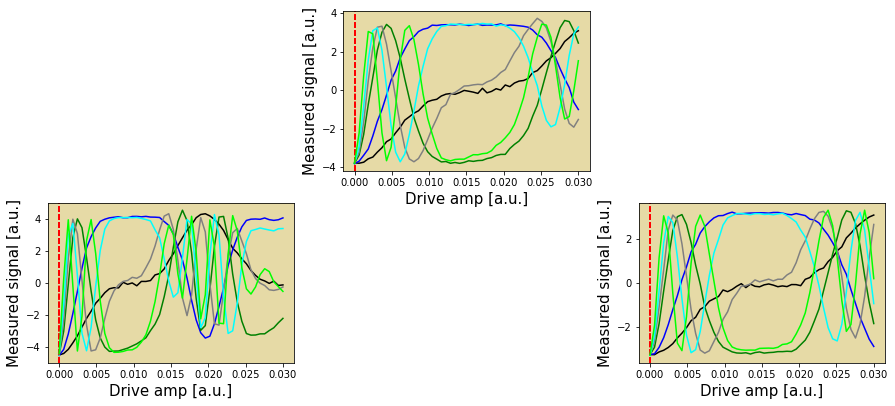

In [340]:
# 608 duration

x90_amps = []
reps = [1, 2, 4, 5, 6, 8]
print(reps)

plt.figure(figsize=(15, 10))

for rep_idx in range(len(reps)):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
        x90_amps.append(x90_amp)
plt.show()

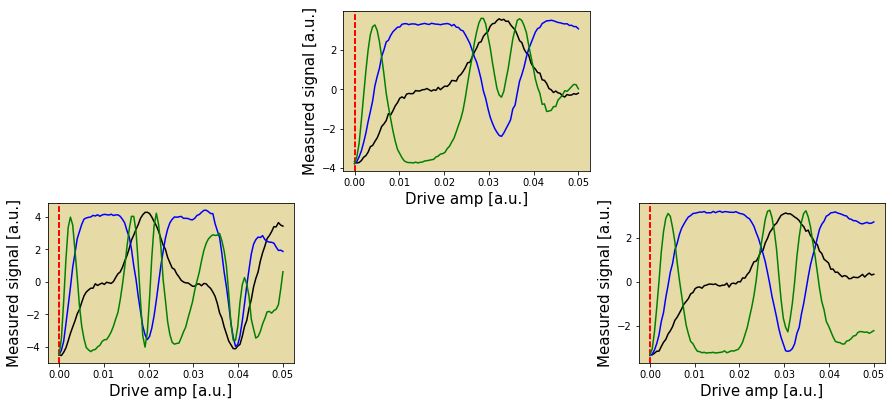

In [326]:
# 608 duration

x90_amps = []
reps = [1,2,4,5]

plt.figure(figsize=(15, 10))

for rep_idx in range(len(reps)-1):
    for qubit_idx in qubits:
        ax = plt.subplot(3, 3, qubit_idx+1)
        x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax, offset=rep_idx)
        x90_amps.append(x90_amp)
plt.show()

#### Pi/4

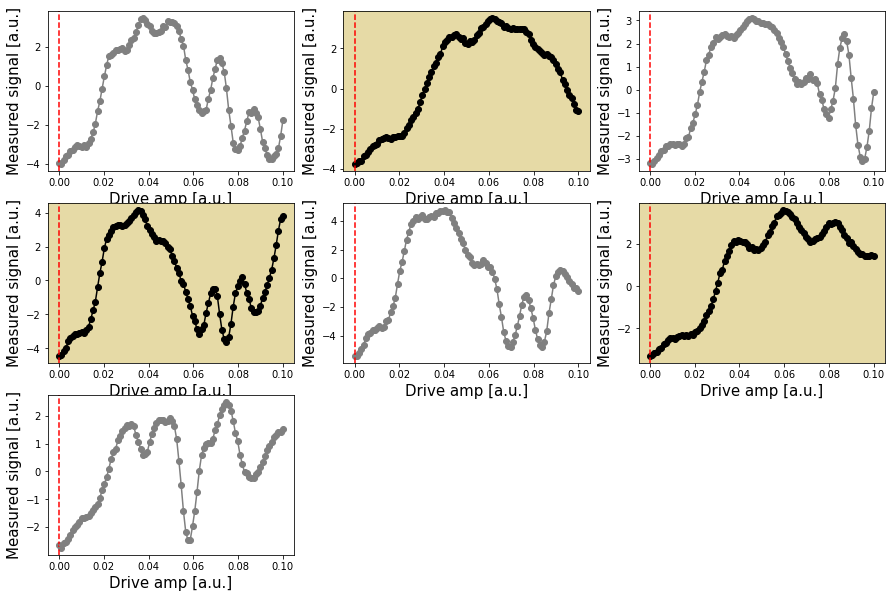

In [282]:
# 608 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

#### Pi/2 * 2

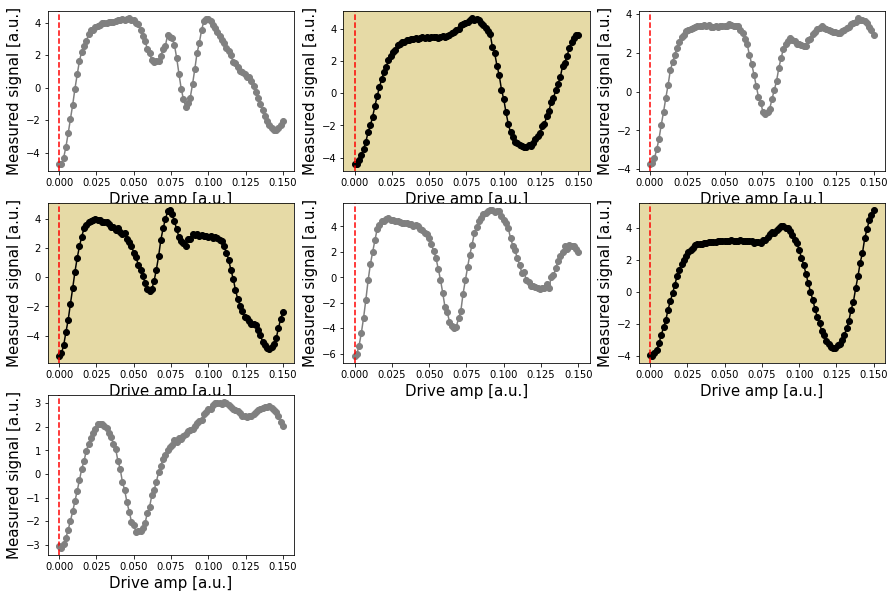

In [246]:
# 11*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

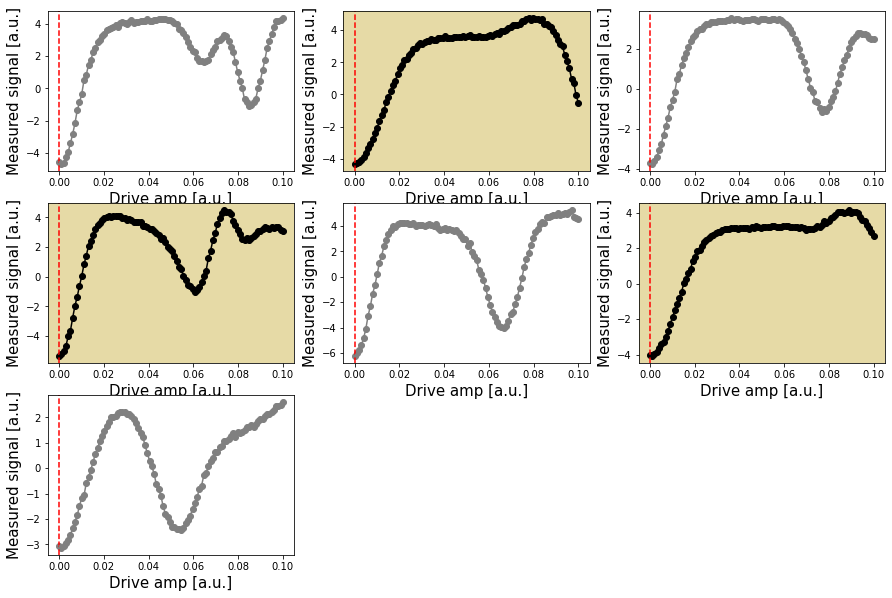

In [241]:
# 11*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

#### Pi/2

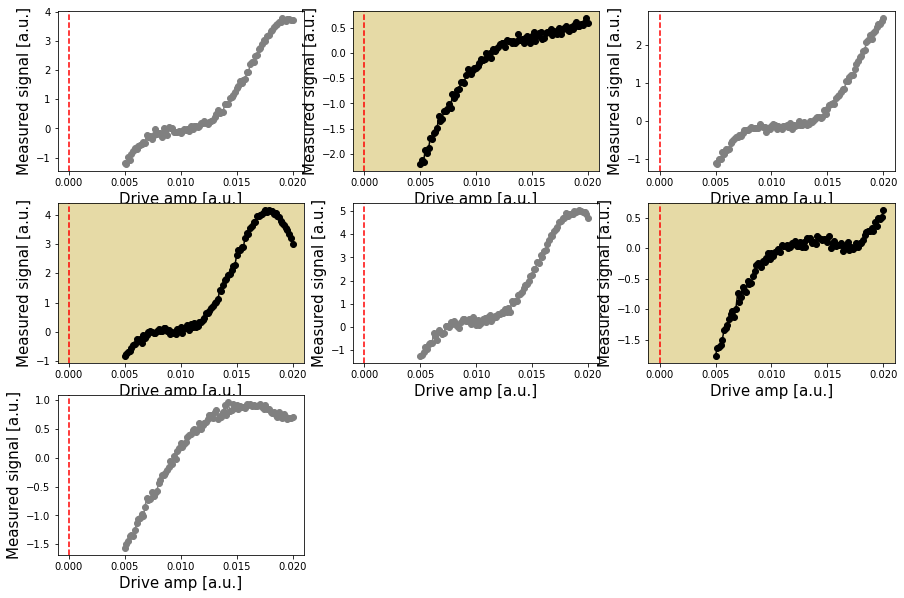

In [262]:
# 41*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

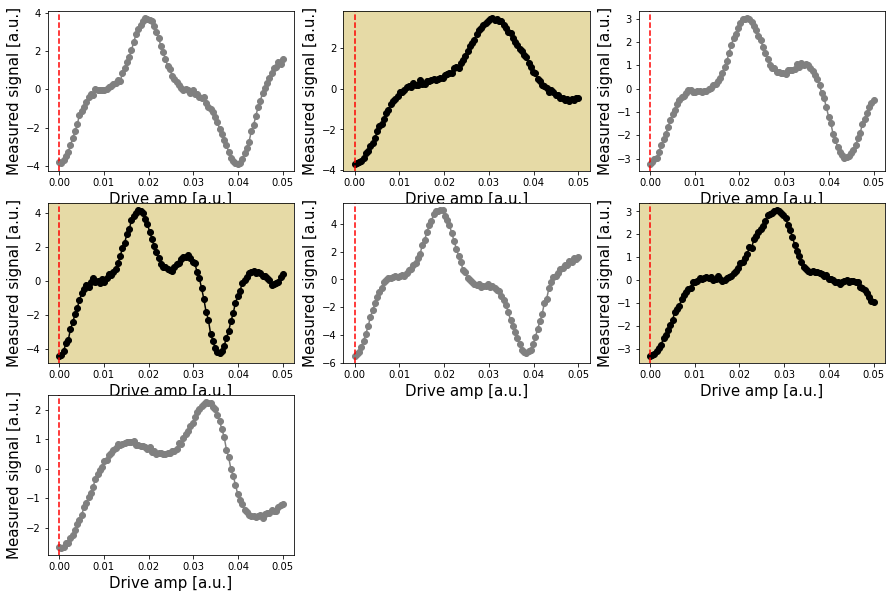

In [258]:
# 41*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

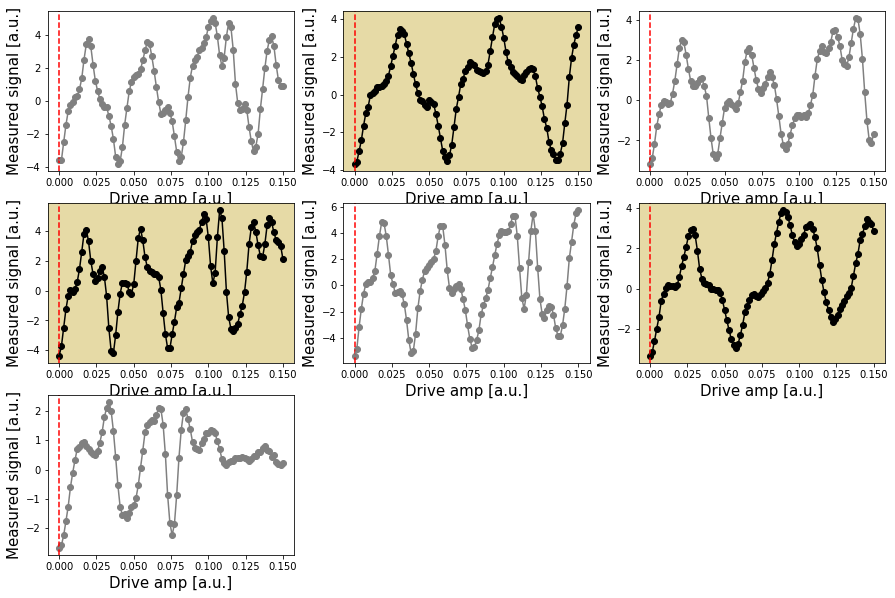

In [254]:
# 41*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

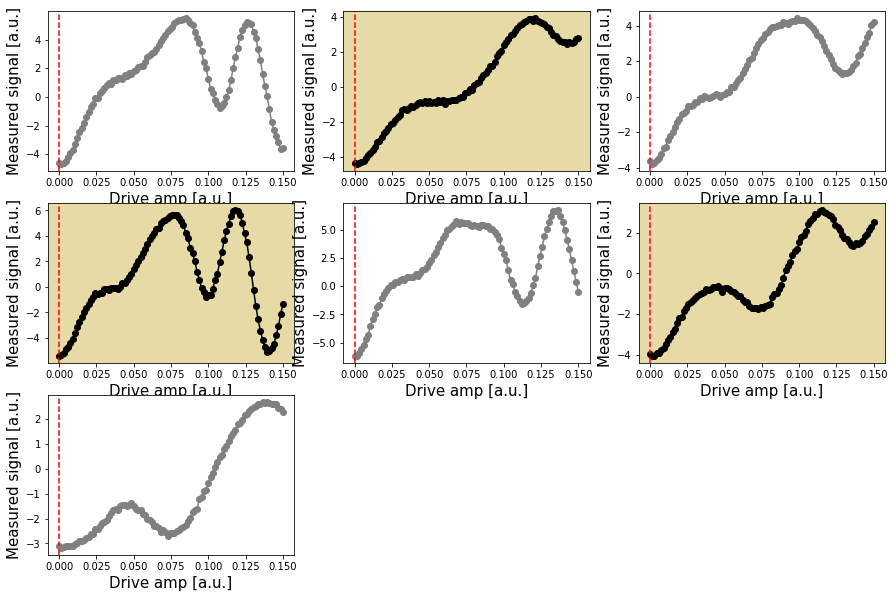

In [250]:
# 11*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

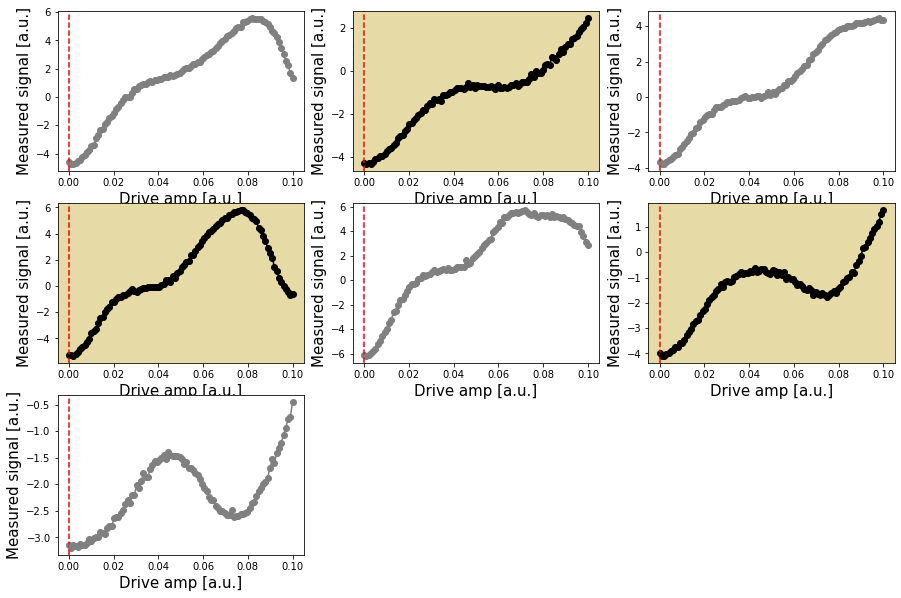

In [237]:
# 11*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

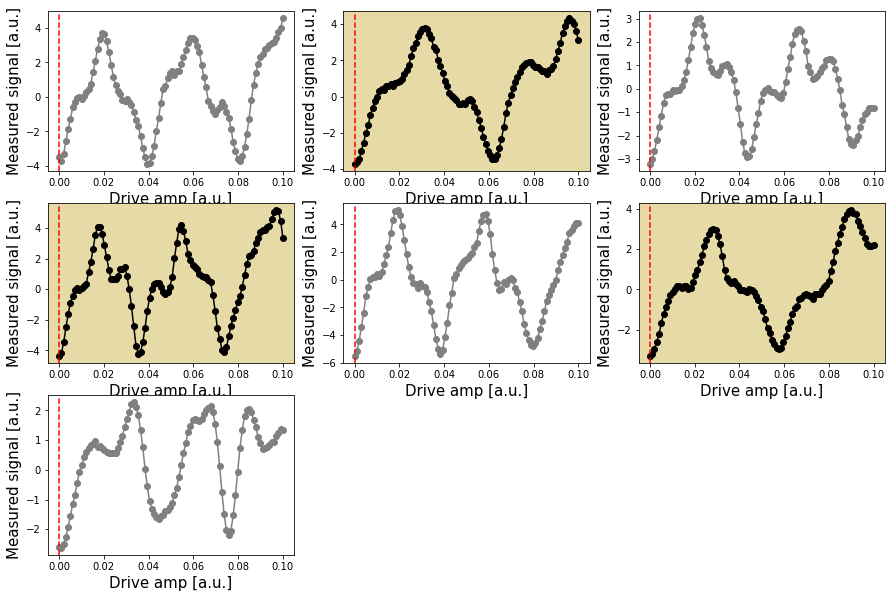

In [223]:
# 41*16 duration

plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

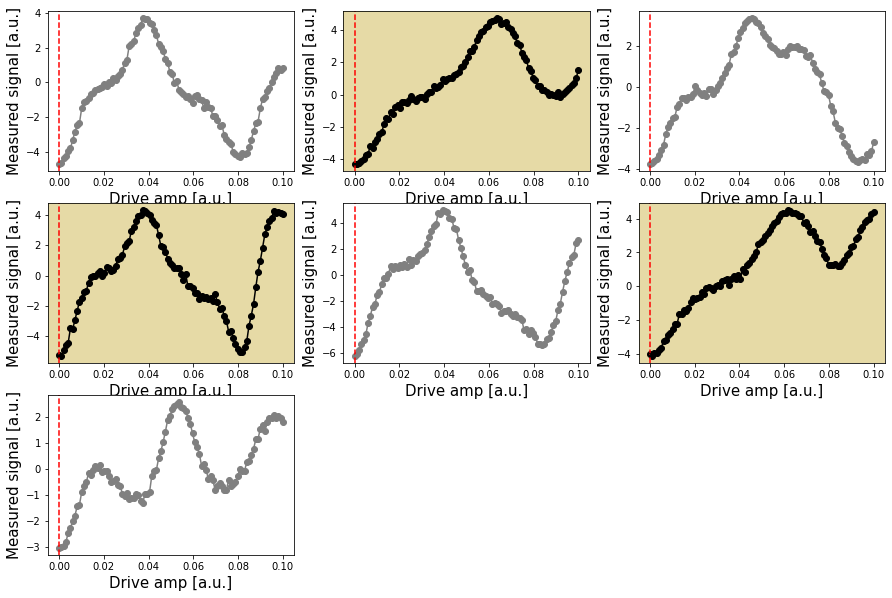

In [213]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    x90_amps.append(x90_amp)
plt.show()

#### pi

The pi/2 pulse amplitude for qubit 1 is: None
The pi/2 pulse amplitude for qubit 3 is: None
The pi/2 pulse amplitude for qubit 5 is: None


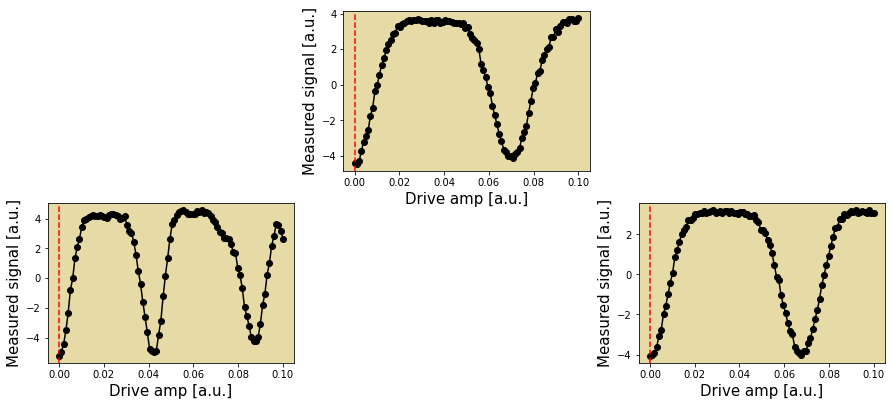

In [90]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()

The pi/2 pulse amplitude for qubit 1 is: None
The pi/2 pulse amplitude for qubit 3 is: None
The pi/2 pulse amplitude for qubit 5 is: None


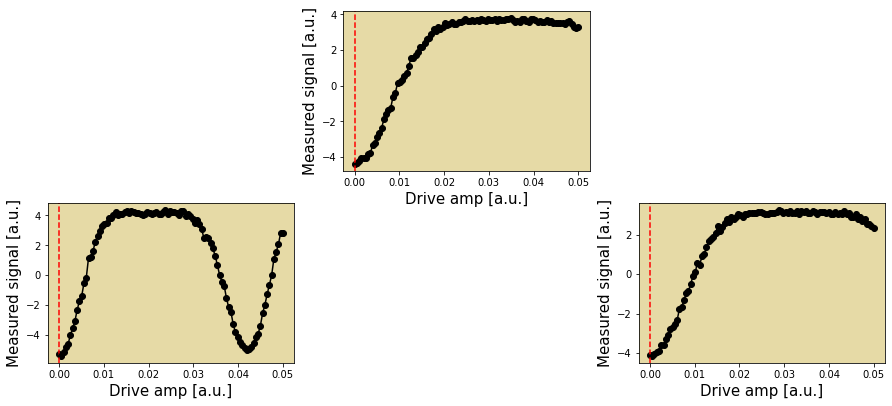

In [86]:
plt.figure(figsize=(15, 10))

x90_amps = []
for qubit_idx in qubits:
    ax = plt.subplot(3, 3, qubit_idx+1)
    x90_amp = fit_x90_and_plot(rabi_result, qubit_idx, amps, ax)
    print("The pi/2 pulse amplitude for qubit {} is: {}".format(qubit_idx, x90_amp))
    # qubit['attrs']['x90_amp'] = x90_amp
    x90_amps.append(x90_amp)
plt.show()